# STAT3612 Project

Group Number: 3612202011

Group members: 

    FENG Yueman 3035447130
    LUO Ruijie  3035535078
    XIE Junya   3035447910
    DU Chengyu  3035448275
    TANG Zixuan 3035449645
    
Main contrabutors of the entire project:

    FENG Yueman 3035447130
    LUO Ruijie  3035535078

Please note that:
1. The Good is labeled as 1 while Bad is labeled as 0 in this report. So the monotonicity constraints are reversed.
2. We have proposed 6 models in total in this group project. We selected `gradient boosting using raw data model` as our final model without monotonicity constraints. The test accuracy obtained is `72.7%`. We selected `XG Boost using raw data model` as our final model with monotonicity constraints. The test accuracy abtained is `72.1%`.
3. We did interpretation analysis for nearly all the models proposed. The method to enhance the explanability of our 2 final black box models is SHAP. Other methods like LIME, partial dependence plot, ICE plot are adopted for other models.
4. The detailed interpretations will only be given under the two selected models. In order to distinguish with others, the sub-titles under these two selected models are in blue.
5. The logic of this report follows the timeline of how we did the project. You may see a few steps of reloading the data, that's because we tried models with raw data.


In [144]:
!pip install pycebox
!pip install shap
!pip install scorecardpy
!pip install pygam
!pip install torch

In [145]:
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import numpy as np
import seaborn as sns
import scorecardpy as sc
sns.set(style='white',context='notebook',palette='muted')
import statsmodels.api as sm

from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split


## Data Preprocessing

### Load Data Set

In [146]:
from google.colab import drive
drive.mount('/content/drive')
df = pd.read_csv("/content/drive/My Drive/STAT3612/HelocData.csv", index_col = None, na_values = [-7, -8, -9])
#df = pd.read_csv('HelocData.csv', na_values=[-7,-8,-9])
df.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,RiskFlag,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23
0,Bad,75.0,169.0,2.0,59.0,21.0,0.0,0.0,100.0,NaN,7.0,8.0,22.0,4.0,36.0,NaN,4.0,4.0,43.0,112.0,4.0,6.0,0.0,83.0
1,Bad,66.0,502.0,4.0,145.0,34.0,0.0,0.0,97.0,36.0,6.0,6.0,37.0,4.0,27.0,4.0,3.0,3.0,80.0,53.0,17.0,3.0,12.0,83.0
2,Good,69.0,338.0,2.0,62.0,22.0,0.0,0.0,96.0,12.0,6.0,6.0,23.0,3.0,35.0,0.0,4.0,4.0,25.0,100.0,3.0,2.0,1.0,45.0
3,Good,75.0,422.0,1.0,91.0,55.0,0.0,0.0,100.0,NaN,7.0,8.0,57.0,4.0,33.0,0.0,4.0,4.0,2.0,11.0,12.0,2.0,1.0,57.0
4,Bad,63.0,242.0,2.0,68.0,25.0,0.0,0.0,100.0,NaN,7.0,8.0,26.0,1.0,19.0,NaN,3.0,3.0,73.0,NaN,12.0,1.0,5.0,87.0


In [147]:
data_dict = pd.read_excel('/content/drive/My Drive/STAT3612/HelocDataDict.xlsx', index_col=0)
data_dict.head()

,Description
Variable Names,
RiskFlag,Paid as negotiated flag (12-36 Months). String...
x1,Consolidated version of risk markers
x2,Months Since Oldest Trade Open
x3,Months Since Most Recent Trade Open
x4,Average Months in File


### Data Visualisation

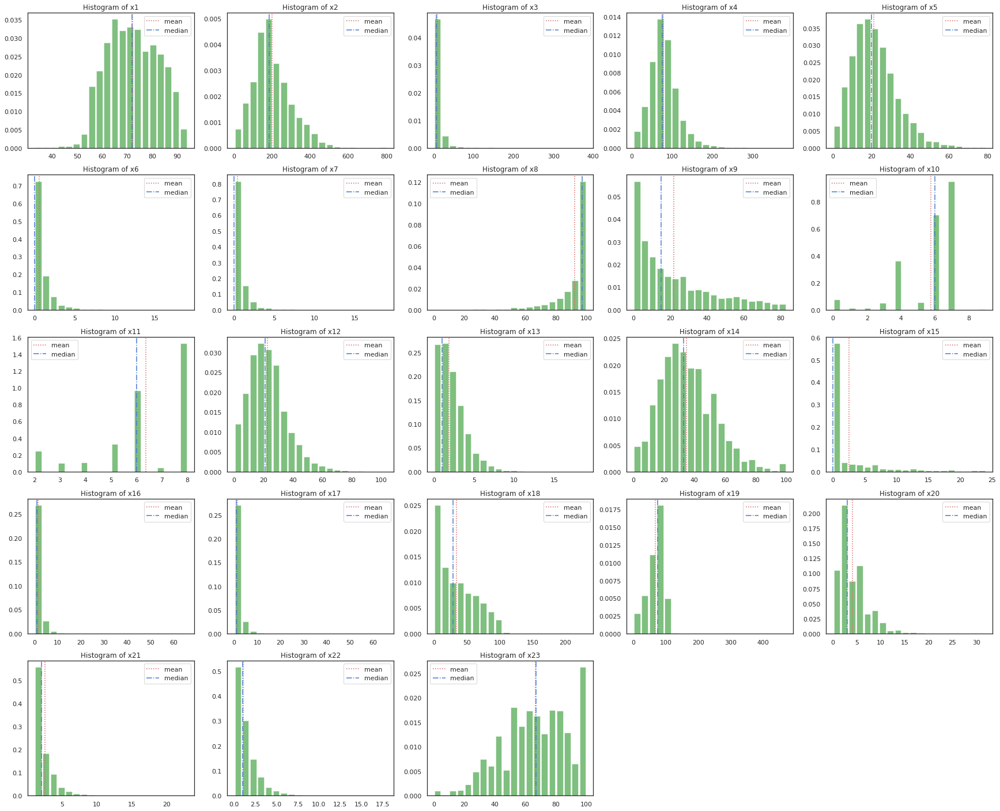

In [148]:
#plot histograms for each variable
cols = 5
rows = np.ceil(len(df.columns.drop('RiskFlag'))/cols)

fig = plt.figure(figsize=(6*cols,5*rows))
for i, fea_name in enumerate(df.columns.drop('RiskFlag')):
  ax = fig.add_subplot(rows,cols,i+1)
  df.loc[:,fea_name].hist(color='green',alpha=0.5,rwidth=0.8, density=True,
                          grid=False,ax=ax, bins=20)
  plt.axvline(df.loc[:,fea_name].mean(), 
              color='r',linestyle=':',label = 'mean')
  plt.axvline(df.loc[:,fea_name].median(), color='b', linestyle='-.', 
              label = 'median')
  plt.legend()
  #df.loc[:,fea_name].plot(kind='density', color='green')
  ax.set_title("Histogram of " + fea_name)
  
plt.show()

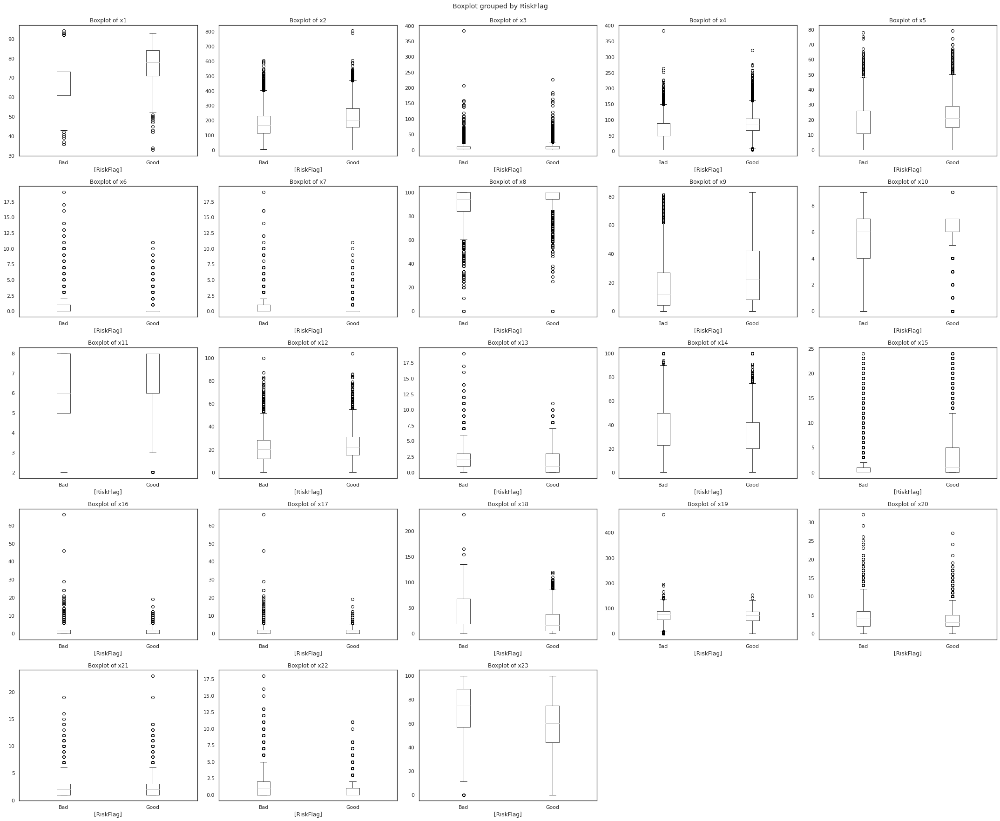

In [149]:
#box plots for each features
cols = 5
rows = np.ceil(len(df.columns.drop('RiskFlag'))/cols)

fig = plt.figure(figsize=(6*cols,5*rows))
for i, fea_name in enumerate(df.columns.drop('RiskFlag')):
  ax = fig.add_subplot(rows,cols,i+1)
  df.loc[:,['RiskFlag',fea_name]].boxplot(by='RiskFlag',
                                          grid=False,ax=ax)
  ax.set_title("Boxplot of " + fea_name)
  
plt.tight_layout(rect=[0, 0, 1, 0.97]) # remove extra space
plt.show()

## Feature Engineering

### Step1: Missing Value Processing (1)

#### Visualise missing value frequency grouped by missing value labels

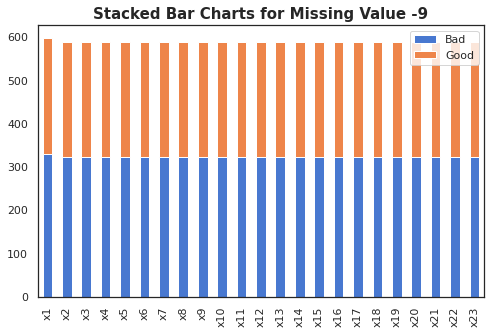

In [150]:
# reimport data set as df1 because we have replaced missing values by NaN previously
df1 = pd.read_csv("/content/drive/My Drive/STAT3612/HelocData.csv", index_col = None)
#count the missing value frequency -9 for both Good and Bad
Count = pd.DataFrame()
for i in range(1,24):
  c= pd.DataFrame( df1['RiskFlag'][df1.iloc[:,i]==-9].value_counts().fillna(0)).T.rename(index = {'RiskFlag':'x'+str(i)})
  Count = pd.concat([Count,c], axis=0)

#plot the missing frequency -9 with stacked bar plot
Count.plot.bar(stacked=True, figsize=(8,5))
plt.title('Stacked Bar Charts for Missing Value -9', fontsize=15, fontweight="bold")
plt.show()

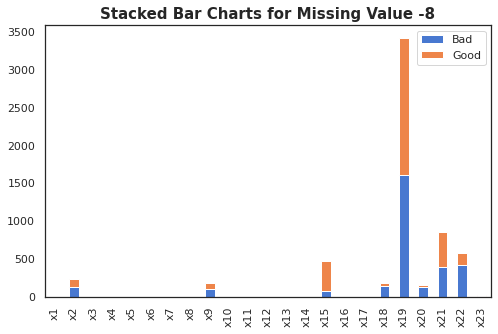

In [151]:
#count the missing value frequency -8 for both Good and Bad
Count = pd.DataFrame()
for i in range(1,24):
  c= pd.DataFrame( df1['RiskFlag'][df1.iloc[:,i]==-8].value_counts().fillna(0)).T.rename(index = {'RiskFlag':'x'+str(i)})
  Count = pd.concat([Count,c], axis=0)
  
#plot the missing frequency -9 with stacked bar plot
Count.plot.bar(stacked=True, figsize=(8,5))
plt.title('Stacked Bar Charts for Missing Value -8', fontsize=15, fontweight="bold")
plt.show()

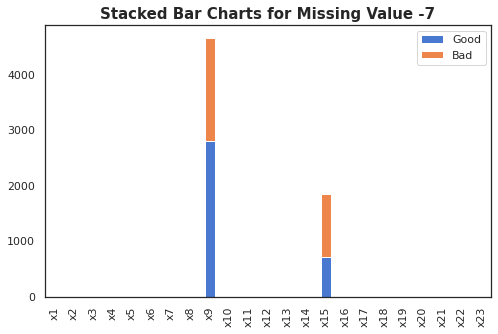

In [152]:
#count the missing value frequency -7 for both Good and Bad
Count = pd.DataFrame()
for i in range(1,24):
  c= pd.DataFrame( df1['RiskFlag'][df1.iloc[:,i]==-7].value_counts().fillna(0)).T.rename(index = {'RiskFlag':'x'+str(i)})
  Count = pd.concat([Count,c], axis=0)
  
#plot the missing frequency -7 with stacked bar plot
Count.plot.bar(stacked=True, figsize=(8,5))
plt.title('Stacked Bar Charts for Missing Value -7', fontsize=15, fontweight="bold")
plt.show()

#### Visualise missing value frequency

x1      5.72%
x2      7.91%
x3      5.62%
x4      5.62%
x5      5.62%
x6      5.62%
x7      5.62%
x8      5.62%
x9     51.90%
x10     5.62%
x11     5.62%
x12     5.62%
x13     5.62%
x14     5.62%
x15    27.91%
x16     5.62%
x17     5.62%
x18     7.40%
x19    38.31%
x20     7.11%
x21    13.85%
x22    11.20%
x23     5.79%


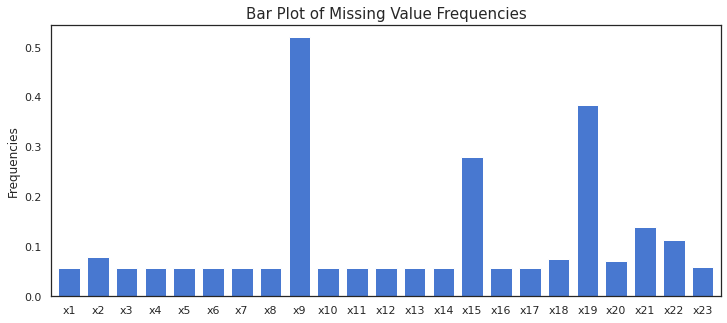

In [153]:
#count missing value and visualise
df_miss_num = df.iloc[:, 1:].isnull().sum()
df_total_num = df.shape[0]
df_miss_freq = df_miss_num / df_total_num
print(df_miss_freq.apply(lambda x: format(x, '.2%')).to_string())

plt.figure(figsize=(12, 5))
df_miss_freq.plot.bar(width=0.75, rot=0, ax=plt.gca())
plt.ylabel('Frequencies')
plt.title('Bar Plot of Missing Value Frequencies', fontsize=15)
plt.show()


#### Drop columns with high missing value frequency

In [154]:
#Drop cloumns with high missing frequency
df.drop('x9', axis=1, inplace=True)
df.drop('x15', axis=1, inplace=True)
df.drop('x19', axis=1, inplace=True)

### Step2: Correlation between Features and RiskFlag

#### Heatmap of correlation coefficient

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5]),
 <a list of 21 Text major ticklabel objects>)

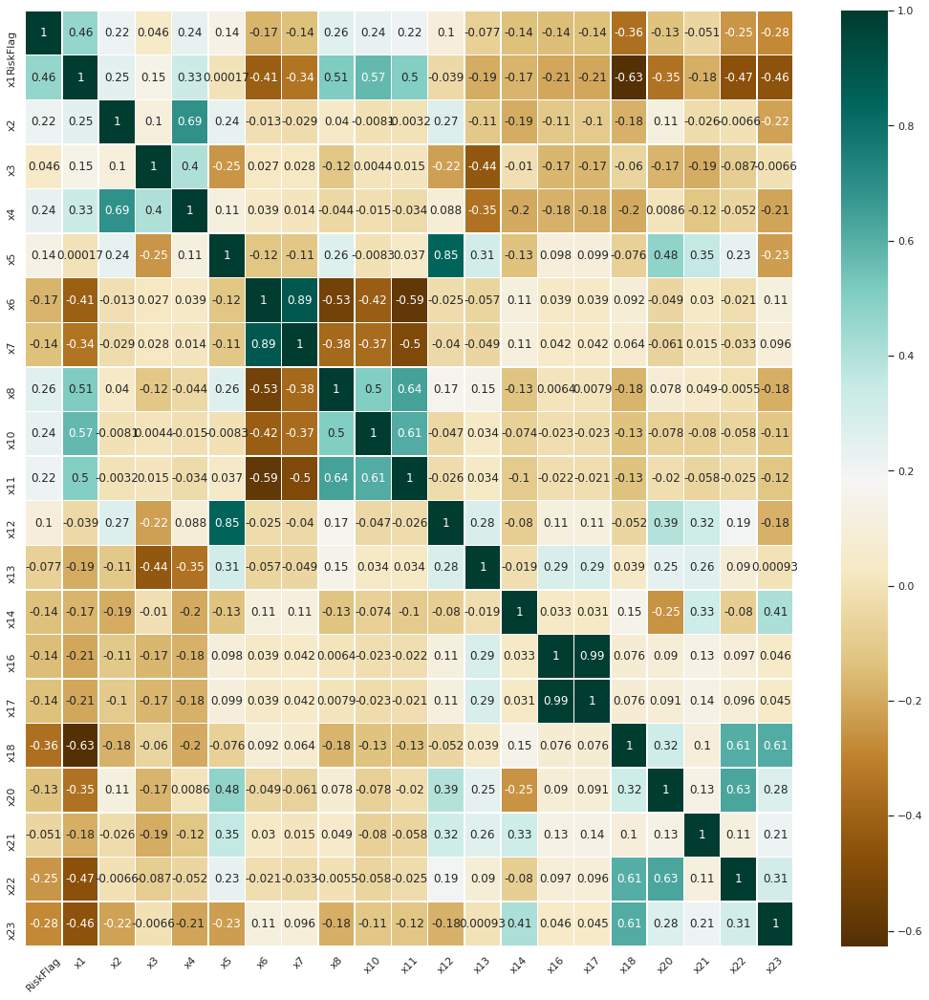

In [155]:
#plot heatmap of correlation coefficient 
import seaborn as sns
sns.set(style='white',context='notebook',palette='muted')

# convert categorical values into numerical values
df = df.replace('Good',1)
df = df.replace('Bad',0)

plt.figure(figsize=(18,18))
sns.heatmap(df[df.columns].corr(),cmap='BrBG',annot=True,
           linewidths=.5)
plt.xticks(rotation=45)

#### Drop columns with low correlation coefficient with RiskFlag

In [156]:
#drop the variables that has correlation coefficient <0.1 with RiskFlag
df.drop('x3', axis=1, inplace=True)
df.drop('x13', axis=1, inplace=True)
df.drop('x21', axis=1, inplace=True)

### Step 3: Convert RiskFlag to Numerical Values and Split into Train and Test Sets

In [157]:
df = df.replace('Good', 1)
df = df.replace('Bad', 0)

In [158]:
# Split train test data set
np.random.seed(3612202011)
df_train, df_test = train_test_split(df,test_size=0.2)
print(df_train.shape)
print(df_test.shape)

(8367, 18)
(2092, 18)


### Step4: Missing Value Processing (2)

#### Impute missing value with SimpleImputer

In [159]:
# Impute missing value with SimpleImputer
def SI(df,imp):
  df_cp = df.copy()
  imp = SimpleImputer(missing_values=np.nan)
  imp.fit(df.iloc[:,1:])
  df_cp.iloc[:,1:] = imp.transform(df.iloc[:,1:])
  return df_cp
imp = SimpleImputer(missing_values=np.NaN,strategy='mean')
df_train_final = SI(df_train,imp)
df_train_final.head()

,RiskFlag,x1,x2,x4,x5,x6,x7,x8,x10,x11,x12,x14,x16,x17,x18,x20,x22,x23
3266,0,72.069088,200.413784,78.820652,21.060794,0.582154,0.385996,92.316608,5.755435,6.368049,22.533493,34.508215,1.456775,1.39775,34.960865,4.101886,1.101649,66.575842
4919,0,74.000000,172.000000,82.000000,14.000000,0.000000,0.000000,81.000000,4.000000,6.000000,16.000000,38.000000,2.000000,2.00000,3.000000,2.000000,0.000000,43.000000
3392,1,65.000000,258.000000,98.000000,21.000000,7.000000,2.000000,70.000000,4.000000,4.000000,55.000000,33.000000,0.000000,0.00000,2.000000,2.000000,0.000000,46.000000
6644,0,58.000000,117.000000,54.000000,14.000000,2.000000,1.000000,80.000000,4.000000,5.000000,15.000000,47.000000,0.000000,0.00000,46.000000,5.000000,1.000000,80.000000
6407,0,72.000000,78.000000,44.000000,12.000000,1.000000,1.000000,92.000000,6.000000,3.000000,13.000000,15.000000,0.000000,0.00000,58.000000,3.000000,0.000000,86.000000


In [160]:
df_test_final = SI(df_test,imp)
df_test_final.head()

,RiskFlag,x1,x2,x4,x5,x6,x7,x8,x10,x11,x12,x14,x16,x17,x18,x20,x22,x23
7291,0,72.025536,202.202823,78.606432,21.366514,0.578356,0.379786,92.534967,5.768249,6.400715,23.047473,35.064829,1.452782,1.394589,34.43975,4.103018,1.054069,65.936573
6423,1,74.000000,165.000000,68.000000,28.000000,0.000000,0.000000,97.000000,6.000000,6.000000,30.000000,33.000000,1.000000,1.000000,58.00000,4.000000,1.000000,67.000000
6526,0,63.000000,320.000000,88.000000,13.000000,1.000000,1.000000,79.000000,2.000000,4.000000,14.000000,29.000000,0.000000,0.000000,17.00000,3.000000,0.000000,36.000000
7055,0,73.000000,236.000000,74.000000,24.000000,0.000000,0.000000,92.000000,4.000000,6.000000,29.000000,46.000000,0.000000,0.000000,44.00000,4.000000,1.000000,54.000000
8702,1,72.025536,202.202823,78.606432,21.366514,0.578356,0.379786,92.534967,5.768249,6.400715,23.047473,35.064829,1.452782,1.394589,34.43975,4.103018,1.054069,65.936573


In [161]:
nanstrain = df_train_final.iloc[:, 1:].isnull().sum().sum()
nanstest = df_test_final.iloc[:, 1:].isnull().sum().sum()
print('Number of NaNs remain in training set:', nanstrain)
print('Number of NaNs remain in testing set:', nanstest)

Number of NaNs remain in training set: 0
Number of NaNs remain in testing set: 0


### Step 5: Categorical Binning and Encoding

for categorical variables x10 and x11 using chimerge binning method.
Reasons: it is rather discrete according to the box plot, it is supervised binning technique based on chi squared test. It is used to simply it to smaller number of groups.

[INFO] creating woe binning ...


,variable,bin,count,count_distr,good,bad,badprob,woe,bin_iv,total_iv,breaks,is_special_values
0,x10,"[-inf, 4.0)",536,0.064061,379,157,0.292910,-0.795903,0.037953,0.310849,4.0,False
1,x10,"[4.0, 5.755)",1493,0.178439,1095,398,0.266577,-0.926671,0.140535,0.310849,5.755,False
2,x10,"[5.755, 7.0)",2934,0.350663,1590,1344,0.458078,-0.082697,0.002393,0.310849,7.0,False
3,x10,"[7.0, inf)",3404,0.406836,1298,2106,0.618684,0.569353,0.129968,0.310849,inf,False


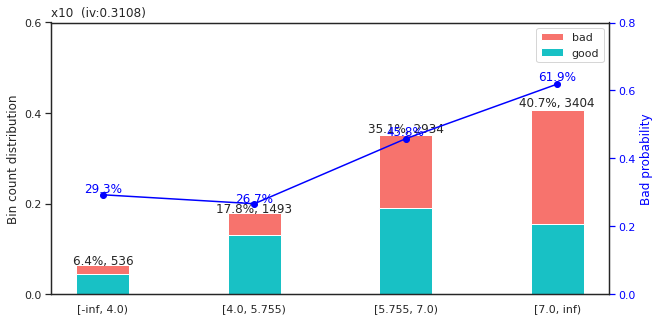

[INFO] creating woe binning ...


,variable,bin,count,count_distr,good,bad,badprob,woe,bin_iv,total_iv,breaks,is_special_values
0,x11,"[-inf, 6.0)",1889,0.225768,1253,636,0.336686,-0.592710,0.076135,0.214028,6.0,False
1,x11,"[6.0, 7.0)",2734,0.326760,1620,1114,0.407462,-0.289082,0.026953,0.214028,7.0,False
2,x11,"[7.0, inf)",3744,0.447472,1489,2255,0.602297,0.500432,0.110940,0.214028,inf,False


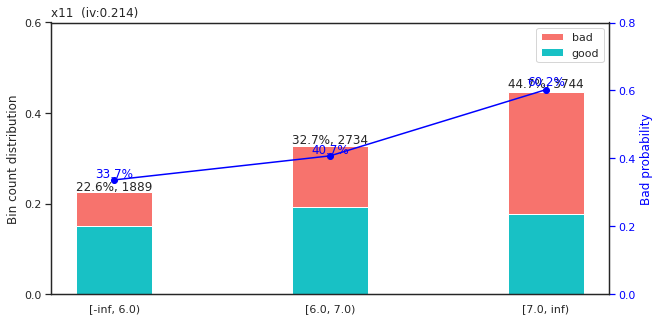

In [162]:
binning_features = ['x10', 'x11']
for fea_name in binning_features:
  #binning
  bins_CM = sc.woebin(df_train_final, y='RiskFlag', x=fea_name, method='Chimerge')
  
  #manipulate layouts
  breaks = bins_CM[fea_name]['breaks'].values.astype(np.float)
  breaks_ = np.insert(breaks,0,-np.inf)
  bins_CM[fea_name]['breaks'] = breaks.round(3).astype(str)
  bins_CM[fea_name]['bin'] = pd.cut(breaks_[:-1],breaks_,right=False)
  display(bins_CM[fea_name])
  df_train_final['ChiMerge ' + fea_name] = pd.cut(df_train_final[fea_name],breaks_,right=False)
  df_test_final['ChiMerge ' + fea_name] = pd.cut(df_test_final[fea_name],breaks_,right=False)

  #drop the original columns
  df_train_final.drop(fea_name, axis = 1, inplace=True)
  df_test_final.drop(fea_name, axis = 1, inplace=True)

  #figures
  sc.woebin_plot(bins_CM)
  fig = plt.gcf()
  fig.set_size_inches((10,5))
  plt.show()



In [163]:
# Encode all the categorical features
from sklearn.preprocessing import LabelEncoder

lbenc = LabelEncoder()
cols = []
for fea in binning_features:
  cols.append('ChiMerge ' + fea)
for col in cols:
  df_train_final[col] = lbenc.fit_transform(df_train_final[col])
  df_test_final[col] = lbenc.fit_transform(df_test_final[col])

In [164]:
var_names = data_dict['Description'].apply(lambda x: x.split('.')[0] if '.' in x else x)[1:]     
feature_names = var_names.to_frame()
feature_names = feature_names.loc[df_train.columns[1:],:]
feature_names.loc['ChiMerge x10'] = var_names['x10']
feature_names.loc['ChiMerge x11'] = var_names['x11']
feature_names = feature_names.T
feature_names = feature_names.values.tolist()[0]
print(feature_names)

['Consolidated version of risk markers', 'Months Since Oldest Trade Open', 'Average Months in File', 'Number Satisfactory Trades', 'Number Trades 60+ Ever', 'Number Trades 90+ Ever', 'Percent Trades Never Delinquent', 'Max Delq/Public Records Last 12 Months', 'Max Delinquency Ever', 'Number of Total Trades (total number of credit accounts)', 'Percent Installment Trades', 'Number of Inq Last 6 Months', 'Number of Inq Last 6 Months excl 7days', 'Net Fraction Revolving Burden', 'Number Revolving Trades with Balance', 'Number Bank/Natl Trades w high utilization ratio', 'Percent Trades with Balance', 'Max Delq/Public Records Last 12 Months', 'Max Delinquency Ever']


### Step 6: Preview of data after feature engineering

In [165]:
x_train = df_train_final.drop('RiskFlag',axis=1)
y_train = df_train_final['RiskFlag']
x_train.head()

,x1,x2,x4,x5,x6,x7,x8,x12,x14,x16,x17,x18,x20,x22,x23,ChiMerge x10,ChiMerge x11
3266,72.069088,200.413784,78.820652,21.060794,0.582154,0.385996,92.316608,22.533493,34.508215,1.456775,1.39775,34.960865,4.101886,1.101649,66.575842,2,1
4919,74.000000,172.000000,82.000000,14.000000,0.000000,0.000000,81.000000,16.000000,38.000000,2.000000,2.00000,3.000000,2.000000,0.000000,43.000000,1,1
3392,65.000000,258.000000,98.000000,21.000000,7.000000,2.000000,70.000000,55.000000,33.000000,0.000000,0.00000,2.000000,2.000000,0.000000,46.000000,1,0
6644,58.000000,117.000000,54.000000,14.000000,2.000000,1.000000,80.000000,15.000000,47.000000,0.000000,0.00000,46.000000,5.000000,1.000000,80.000000,1,0
6407,72.000000,78.000000,44.000000,12.000000,1.000000,1.000000,92.000000,13.000000,15.000000,0.000000,0.00000,58.000000,3.000000,0.000000,86.000000,2,0


In [166]:
x_test = df_test_final.drop('RiskFlag',axis=1)
y_test = df_test_final['RiskFlag']
x_test.head()

,x1,x2,x4,x5,x6,x7,x8,x12,x14,x16,x17,x18,x20,x22,x23,ChiMerge x10,ChiMerge x11
7291,72.025536,202.202823,78.606432,21.366514,0.578356,0.379786,92.534967,23.047473,35.064829,1.452782,1.394589,34.43975,4.103018,1.054069,65.936573,2,1
6423,74.000000,165.000000,68.000000,28.000000,0.000000,0.000000,97.000000,30.000000,33.000000,1.000000,1.000000,58.00000,4.000000,1.000000,67.000000,2,1
6526,63.000000,320.000000,88.000000,13.000000,1.000000,1.000000,79.000000,14.000000,29.000000,0.000000,0.000000,17.00000,3.000000,0.000000,36.000000,0,0
7055,73.000000,236.000000,74.000000,24.000000,0.000000,0.000000,92.000000,29.000000,46.000000,0.000000,0.000000,44.00000,4.000000,1.000000,54.000000,1,1
8702,72.025536,202.202823,78.606432,21.366514,0.578356,0.379786,92.534967,23.047473,35.064829,1.452782,1.394589,34.43975,4.103018,1.054069,65.936573,2,1


## Model without Monotonicity Constraints

In this section, we have proposed 4 models including gradient boosting (with feature engineering), gradient boosting (with raw data), a self-designed DNN model, ExNN model. Details of those models will be given under each model.

We eventually selected `gradient boosting (with raw data) as our final model` for its highest `test accuracy: 72.7%`.

We used `SHAP` package and `LIME` package for interpretation. Please note that we did interpretation for all the models but `detailed explanation can only be found under the section Gradient boosting (with raw data)(selected as final model)`.

### Proposed Models

#### Gradient boosting (with feature engineering)

In [167]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV,cross_val_score,StratifiedKFold
kfold=StratifiedKFold(n_splits=10)

In [168]:
GBC = GradientBoostingClassifier()
gb_param_grid = {'loss' : ["deviance"],
              'n_estimators' : [100,200,300],
              'learning_rate': [0.1, 0.05, 0.01],
              'max_depth': [4, 8],
              'min_samples_leaf': [100,150],
              'max_features': [0.3, 0.1] 
              }
modelgsGBC = GridSearchCV(GBC,param_grid = gb_param_grid, cv=kfold, 
                                     scoring="accuracy", n_jobs= -1, verbose = 1)
modelgsGBC.fit(x_train,y_train)
print('modelgsGBC score：%.3f'%modelgsGBC.best_score_)

Fitting 10 folds for each of 72 candidates, totalling 720 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   46.8s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 720 out of 720 | elapsed: 12.6min finished


modelgsGBC score：0.724


In [169]:
modelgsGBC.best_score_

0.7242710066139607

In [170]:
pred_train_gbc = modelgsGBC.predict(x_train)
print('Train accuracy:',accuracy_score(y_train,pred_train_gbc))
pred_test_gbc = modelgsGBC.predict(x_test)
print('Test accuracy:',accuracy_score(y_test,pred_test_gbc))

Train accuracy: 0.7443528146288992
Test accuracy: 0.7174952198852772


Interpretation of Gradient Boosting (with feature engineering)

local interpretation by LIME

In [171]:
!pip install lime
import lime
import lime.lime_tabular

In [172]:
from lime.lime_tabular import LimeTabularExplainer
x_train_lime = x_train.to_numpy()
# To simulate new data points, fit an explainer with data from trainning set
categorical_idx = [15,16]   # get categorical feature names

explainer = LimeTabularExplainer(
    x_train_lime, feature_names=x_train.columns.to_list(), categorical_features=categorical_idx)


In [173]:
i = 6
exp = explainer.explain_instance(
    x_test.iloc[i,:], predict_fn=modelgsGBC.predict_proba, top_labels=1)

# visualize the result
exp.show_in_notebook(show_table=True)

In [174]:
df_test.iloc[[i], :]

,RiskFlag,x1,x2,x4,x5,x6,x7,x8,x10,x11,x12,x14,x16,x17,x18,x20,x22,x23
8440,1,84.0,199.0,100.0,17.0,0.0,0.0,100.0,7.0,8.0,17.0,18.0,0.0,0.0,37.0,2.0,0.0,50.0


local interpretation by Interpret

In [175]:
!pip install interpret

In [176]:
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

In [177]:
# LIME
from interpret.blackbox import LimeTabular
from interpret import show

# LIME explainers
# feature_names should be transferred into list type in IML
lime = LimeTabular(predict_fn=modelgsGBC.predict_proba, data=x_train.to_numpy(),
                   random_state=1, feature_names=x_train.columns.to_list())

# local explaination on instances
lime_local = lime.explain_local(x_test.iloc[:20,:], y_test[:20], name='LIME')

# visualization
show(lime_local)

Importance of features

In [178]:
!pip install eli5
import eli5 
from eli5.sklearn import PermutationImportance

In [179]:
# define a permutation importance object
perm = PermutationImportance(modelgsGBC).fit(x_train, y_train)
# show the importance
feature_names_1 = x_train.columns.values
eli5.show_weights(perm, feature_names=feature_names_1)

Weight,Feature
0.0153 ± 0.0056,x4
0.0151 ± 0.0053,x18
0.0112 ± 0.0055,x1
0.0109 ± 0.0050,x8
0.0098 ± 0.0048,x5
0.0072 ± 0.0030,x22
0.0072 ± 0.0019,ChiMerge x10
0.0049 ± 0.0026,ChiMerge x11
0.0048 ± 0.0022,x14
0.0048 ± 0.0016,x2


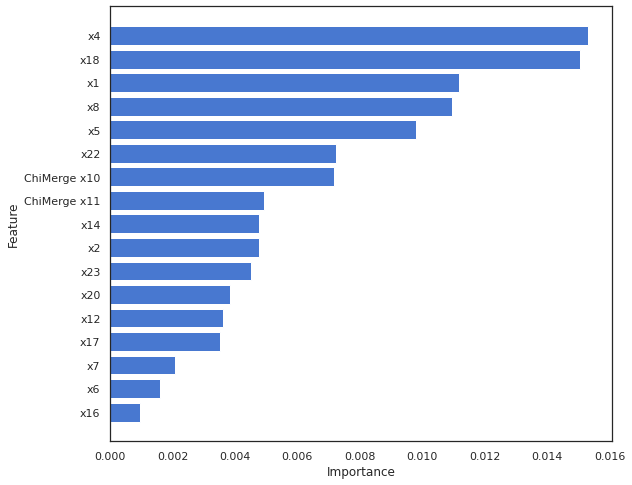

In [180]:
# importance in decreasing order
imp_ord = np.argsort(perm.feature_importances_)

plt.figure(figsize=(9,8))
yaxis = np.arange(len(perm.feature_importances_))*1
plt.barh(y = yaxis,width = perm.feature_importances_[imp_ord])
plt.yticks(yaxis,feature_names_1[imp_ord])
plt.ylabel('Feature')
plt.xlabel('Importance')
plt.show()

Partial Dependence Plot

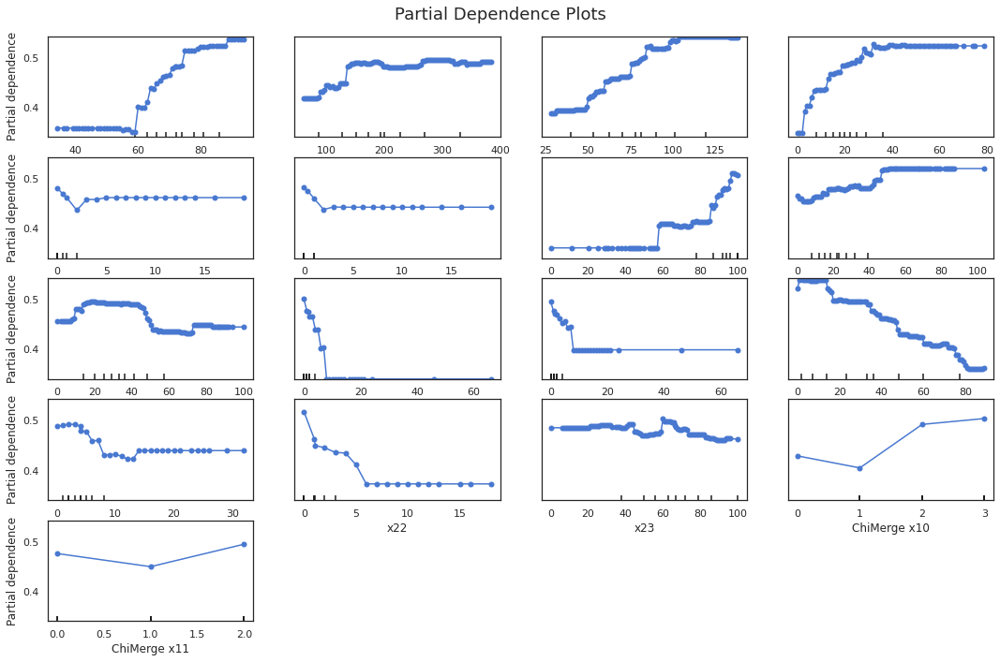

In [181]:
from sklearn.inspection import plot_partial_dependence as pdp
n_cols = 4
n_rows = feature_names_1.shape[0]//n_cols + 1

fig = plt.figure(figsize=(15, 2*n_rows))
pdp(modelgsGBC, x_train, features=feature_names_1, feature_names=feature_names_1,
    n_cols=n_cols, fig=fig, line_kw={'marker': 'o', 'markeredgecolor': 'None'})

plt.suptitle('Partial Dependence Plots', fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.97])

ICE curves

In [182]:
import pycebox.ice as icebox

# monkey patch a typo in `pycebox` which calls __get_quantiles instead of _get_quantiles


def __get_quantiles(x):
    return np.greater.outer(x, x).sum(axis=1) / x.size


icebox.__get_quantiles = __get_quantiles

# define a function to get predicted probability of 'Survived' for ICE plot


def pred_fun(X_train):
    return modelgsGBC.predict_proba(X_train)[:, 1]


df_X_train = df_train_final.iloc[:, 1:]

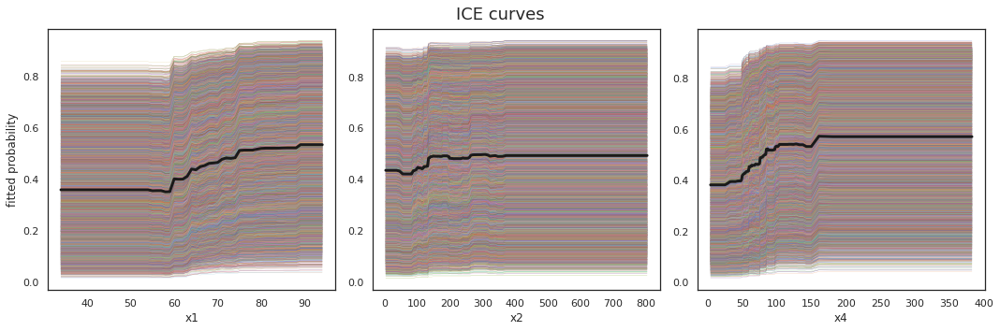

In [183]:
# Fig1: uncentered ICE plots
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# plot the first 3 features
for i, feature_name in enumerate(feature_names_1[:3]):
    # generate ICE data points
    ice_df = icebox.ice(df_X_train, column=feature_name,
                        predict=pred_fun, num_grid_points=100)

    # plot
    plt.subplot(axes[i])
    icebox.ice_plot(ice_df, linewidth=0.15, plot_pdp=True,
                    pdp_kwargs={'c': 'k', 'linewidth': 3}, ax=axes[i])
    axes[i].set_xlabel(feature_name)

axes[0].set_ylabel('fitted probability')
plt.suptitle('ICE curves', fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.95])

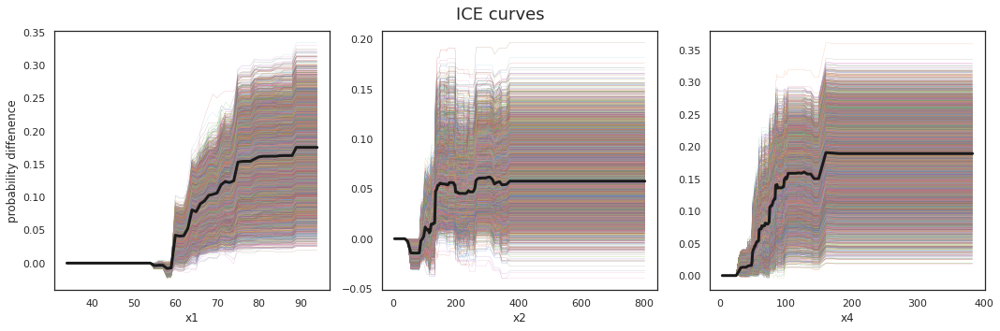

In [184]:
# Fig2: centered ICE plots
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# plot the first 3 features
for i, feature_name in enumerate(feature_names_1[:3]):
    plt.subplot(axes[i])
    ice_df = icebox.ice(df_X_train, column=feature_name,
                        predict=pred_fun, num_grid_points=100)
    icebox.ice_plot(ice_df, linewidth=0.15, plot_pdp=True,
                    pdp_kwargs={'c': 'k', 'linewidth': 3}, centered=True, ax=axes[i])
    axes[i].set_xlabel(feature_name)

axes[0].set_ylabel('probability diffenence')
plt.suptitle('ICE curves', fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.95])

Interpretation by SHAP

In [185]:
import shap
shap.initjs()
explainer1 = shap.KernelExplainer(modelgsGBC.predict_proba, shap.kmeans(x_train, 5))
n_explain = 500
shap_values_1 = explainer1.shap_values(x_train[:n_explain])

In [186]:
explainer1.expected_value

array([0.53, 0.47])

In [187]:
shap.initjs()
i = 1
shap.force_plot(base_value=explainer1.expected_value[1], shap_values=shap_values_1[1][i], 
                features=x_train.iloc[i,:])

In [188]:
shap.initjs()
shap.force_plot(explainer1.expected_value[0], shap_values_1[1], features=df_test.iloc[:,1:])

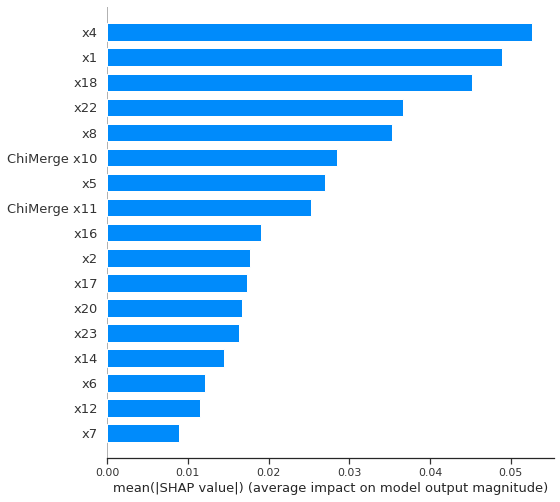

In [189]:
shap.summary_plot(shap_values_1[1], feature_names=feature_names_1, plot_type='bar')

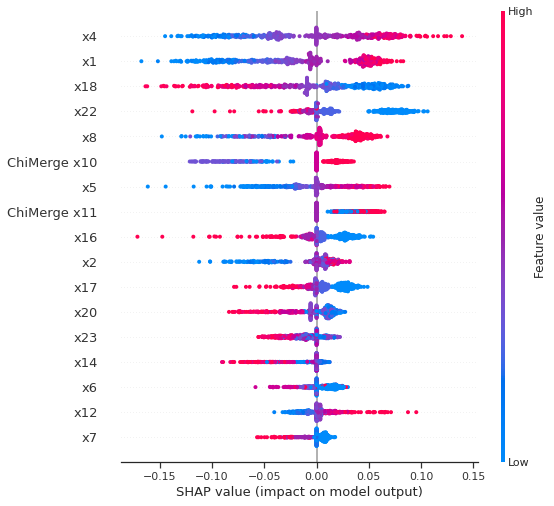

In [190]:
shap.summary_plot(shap_values_1[1], x_train[:n_explain],
                  feature_names=feature_names_1)

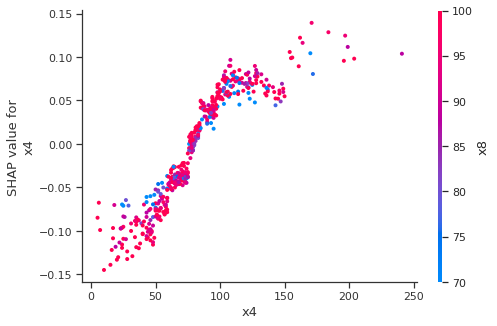

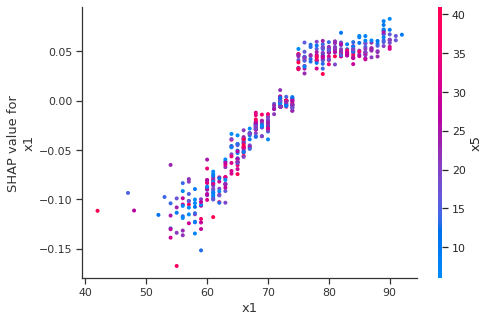

In [191]:
shap.dependence_plot("x4", shap_values_1[1],x_train[:n_explain], feature_names=feature_names_1)
shap.dependence_plot("x1", shap_values_1[1], x_train[:n_explain], feature_names=feature_names_1)

#### Gradient boosting (with raw data)
<font color=blue>**selected as final model**</font>

In [192]:
# we reloaded data set because we are using the raw data in this section
df_nan = pd.read_csv("/content/drive/My Drive/STAT3612/HelocData.csv", index_col = None, na_values = [-7, -8, -9])

np.random.seed(3612202011)
df_nan = df_nan.replace('Good',1)
df_nan = df_nan.replace('Bad',0)
df_train_nan, df_test_nan = train_test_split(df_nan,test_size=0.2)

x_train_nan = df_train_nan.drop('RiskFlag',axis=1)
y_train_nan = df_train_nan['RiskFlag']
x_test_nan = df_test_nan.drop('RiskFlag',axis=1)
y_test_nan = df_test_nan['RiskFlag']

feature_names_nan = x_train_nan.columns.values

In [193]:
from sklearn.experimental import enable_hist_gradient_boosting  # noqa
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.datasets import load_iris
clf = HistGradientBoostingClassifier(learning_rate=0.05, max_depth =8, max_iter=200,l2_regularization=0.5)
clf.fit(x_train_nan, y_train_nan)
print("train accuracy: ",clf.score(x_train_nan,y_train_nan))
print("test accuracy: ",clf.score(x_test_nan,y_test_nan))

train accuracy:  0.840086052348512
test accuracy:  0.7232313575525813


We have noticed that histogram gradient boosting classifier can have different performance on different devices. The test accuracy given by our laptop is `72.7%`. If it's different on yours, please refer to the html file.

<font color=blue>**Local Interpretation by SHAP**</font>

To better illustrate the local interpertation, we used 3 clients' data as example:
1. Client No.1: Alice
2. Client No.11: Bob
3. Client No.6: Cindy

Similar explanations can be applied to other local points.

In [194]:
#shap
import shap
shap.initjs()
explainer1 = shap.KernelExplainer(clf.predict_proba, shap.kmeans(x_train_nan, 5))
n_explain = 500
shap_values_1 = explainer1.shap_values(x_train_nan[:n_explain])

In [195]:
explainer1.expected_value

array([0.39, 0.61])

In [196]:
shap.initjs()
i = 1
shap.force_plot(base_value=explainer1.expected_value[1], shap_values=shap_values_1[1][i], 
                features=x_test_nan.iloc[i,:])

The SHAP plot shown above is the local interpertaion plot for Client No.1 Alice.
1. 3 percent of all the trades done by Alice were overdue. She has inquiries regarding loan recently. These factors make Alice a very risky person
2. The local SHAP diagram shows that her recent inquiry records push her to the bad side by 0.1. The bad trades history push her to the bad side by 0.1 as well. Together with all the other factors, our model tends to recognise Alice as Bad.

In [197]:
shap.initjs()
i = 11
shap.force_plot(base_value=explainer1.expected_value[1], shap_values=shap_values_1[1][i], 
                features=x_test_nan.iloc[i,:])

The SHAP plot shown above is the local interpertaion plot for Client No.11 Bob. 
1. Bob has a pretty satisfying credit record scored as 78. He doesnt have any overdue payment. His first trade record can be traced back to a decade ago, while his most recent purchase was done 4 month ago, meaning that he's not in a situation of having too many trades open. These factors make him a very reliable person. However, 33% of all his trades are paid using installment, which makes the situation a bit ambiguous. 
2. The local SHAP diagram shows that his past risk markers, trade history push him towards the Good side by 0.2, while his installment history makes him a little bit of Bad by 0.1. Together with all the other factors, the overall score tends to recognise Bob as good.

In [198]:
shap.initjs()
i = 6
shap.force_plot(base_value=explainer1.expected_value[1], shap_values=shap_values_1[1][i], 
                features=x_test_nan.iloc[i,:])

The SHAP plot shown above is the local interpertaion plot for Client No.6 Cindy.
1.  Cindy has a long history of trade for nearly 2 decades. During this long time, she never had any overdue payment. She didnt have any inquiry recently. These are all good indicators. One thing that is not that satisfactory is that she doesnt have that many of satisfactory trades. Nevertheless, we would still expect her to be good. 
2. As given by the shap diagram, her solid risk marker record pushes her to the good side significantly, while the drawbacks are trivial. She is recognised as good by our model.

In [199]:
shap.initjs()
shap.force_plot(explainer1.expected_value[0], shap_values_1[1], features=df_test_nan.iloc[:,1:])

<font color=blue>**Global Interpretation by SHAP**</font>

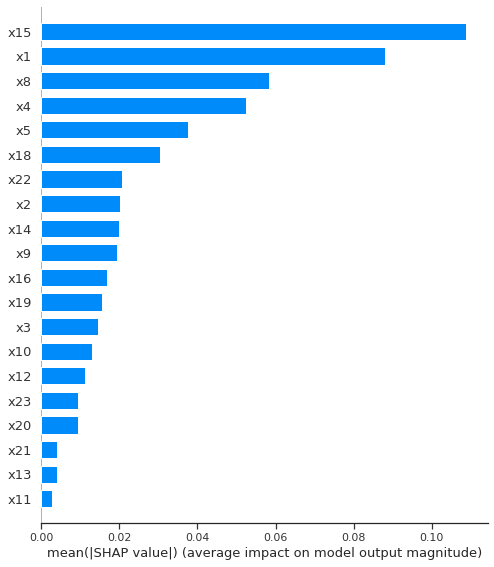

In [200]:
shap.summary_plot(shap_values_1[1], feature_names=feature_names_nan, plot_type='bar')

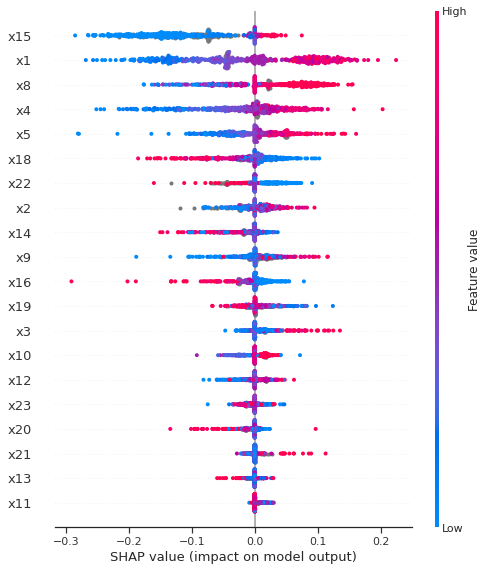

In [201]:
shap.summary_plot(shap_values_1[1], x_train_nan[:n_explain],feature_names = feature_names_nan)

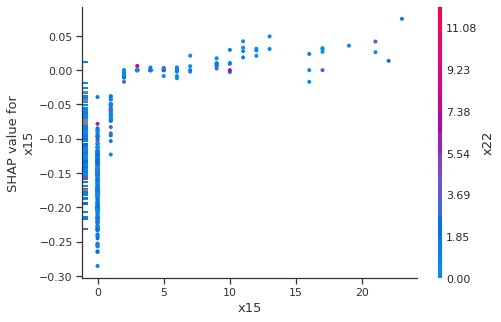

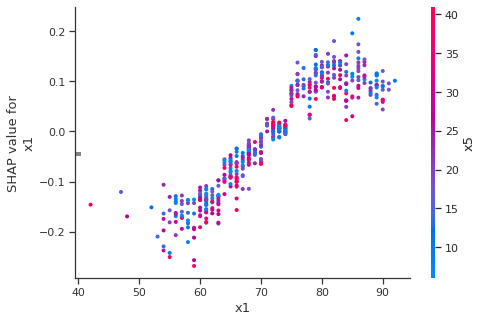

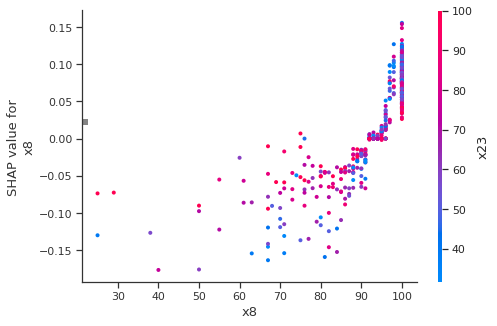

In [202]:
shap.dependence_plot("x15", shap_values_1[1],x_train_nan[:n_explain], feature_names=feature_names_nan)
shap.dependence_plot("x1", shap_values_1[1], x_train_nan[:n_explain], feature_names=feature_names_nan)
shap.dependence_plot("x8", shap_values_1[1], x_train_nan[:n_explain], feature_names=feature_names_nan)

1. From the above plots, we can see that each feature influence the final prediction by 0 to 0.1.
2. there are 3 most important features: x15 stands for months since most recent inquiry, x1 stands for consolidated risk markers and x8 stands for the ratio of perfect trades.
3. The increase of risk markers would push the prediction towards the Good side by up to 0.2 and vice versa, while the more recent the inquiry was made would push the prediction to the bad side by up to 0.3.
4. Similar explanation can be applied to all the other features.

#### ExNN

In [203]:
!pip install git+https://github.com/SelfExplainML/exnn.git

  Cloning https://github.com/SelfExplainML/exnn.git to /tmp/pip-req-build-5c80l3rr
  Running command git clone -q https://github.com/SelfExplainML/exnn.git /tmp/pip-req-build-5c80l3rr
  Created wheel for exnn: filename=exnn-0.1-cp36-none-any.whl size=27343 sha256=b8e57bb0016dc0d76dd2c2cf95b658198cbdb91dd3246823f624f2e4bd24d71e
  Stored in directory: /tmp/pip-ephem-wheel-cache-tzbujvo6/wheels/00/78/3c/c322078832f0d64ccad3cdd355d848531c56f9d8797d4d4748
Successfully built exnn


In [204]:
import torch
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import minmax_scale
from exnn import ExNN

In [205]:
meta_info = {"X1":{"type":"continuous"},
             "X2":{"type":"continuous"},
             "X4":{"type":"continuous"},
             "X5":{"type":"continuous"},
             "X6":{"type":"continuous"},
             "X7":{"type":"continuous"},
             "X8":{"type":"continuous"},
             "X12":{"type":"continuous"},             
             "X14":{"type":"continuous"},
             "X16":{"type":"continuous"},
             "X17":{"type":"continuous"},
             "X18":{"type":"continuous"},
             "X20":{"type":"continuous"},
             "X22":{"type":"continuous"},
             "X23":{"type":"continuous"},
             "ChiMerge x10":{"type":"categorical"},
             "ChiMerge x11":{"type":"categorical"},
             "RiskFlag":{"type":"target"}}

In [206]:
x_train_array = x_train.astype(np.float32).values
y_train_array = y_train.astype(np.float32).values

for i, (key, item) in enumerate(meta_info.items()):
  if item['type'] == "categorical":
    if key == 'ChiMerge x10':
      meta_info[key]["values"] = [0,1,2,3]
    elif key == 'ChiMerge x11':
      meta_info[key]["values"] = [0,1,2]
  elif item['type'] == "continuous":
    sx = MinMaxScaler()
    x_train_array[:,[i]] = sx.fit_transform(x_train_array[:,[i]])
    meta_info[key]["scaler"] = sx

x_train_exnn = torch.Tensor(x_train_array)
y_train_exnn = torch.Tensor(y_train_array)




In [207]:
x_test_array = x_test.astype(np.float32).values
y_test_array = y_test.astype(np.float32).values

for i, (key, item) in enumerate(meta_info.items()):
  if item['type'] == "categorical":
    if key == 'ChiMerge x10':
      meta_info[key]["values"] = [0,1,2,3]
    elif key == 'ChiMerge x11':
      meta_info[key]["values"] = [0,1,2]
  elif item['type'] == "continuous":
    sx = MinMaxScaler()
    x_test_array[:,[i]] = sx.fit_transform(x_test_array[:,[i]])
    meta_info[key]["scaler"] = sx

x_test_exnn = torch.Tensor(x_test_array)
y_test_exnn = torch.Tensor(y_test_array)




In [208]:
model = ExNN(meta_info=meta_info,
               subnet_num=10,
               subnet_arch=[10, 6],
               task_type="Classification",
               activation_func=tf.tanh,
               batch_size=1000,
               training_epochs=10000,
               lr_bp=0.001,
               lr_cl=0.1,
               beta_threshold=0.05,
               tuning_epochs=100,
               l1_proj=0.0001,
               l1_subnet=0.00316,
               l2_smooth=10**(-6),
               verbose=True,
               val_ratio=0.2,)
model.fit(x_train_exnn,y_train_exnn)

Initial training.
Training epoch: 1, train loss: 0.62048, val loss: 0.61130
Training epoch: 2, train loss: 0.60824, val loss: 0.59982
Training epoch: 3, train loss: 0.59446, val loss: 0.58518
Training epoch: 4, train loss: 0.58970, val loss: 0.58000
Training epoch: 5, train loss: 0.58788, val loss: 0.57792
Training epoch: 6, train loss: 0.59567, val loss: 0.58543
Training epoch: 7, train loss: 0.58396, val loss: 0.57342
Training epoch: 8, train loss: 0.57801, val loss: 0.56724
Training epoch: 9, train loss: 0.57699, val loss: 0.56500
Training epoch: 10, train loss: 0.57474, val loss: 0.56288
Training epoch: 11, train loss: 0.57435, val loss: 0.56214
Training epoch: 12, train loss: 0.57331, val loss: 0.56036
Training epoch: 13, train loss: 0.57226, val loss: 0.55994
Training epoch: 14, train loss: 0.56978, val loss: 0.55638
Training epoch: 15, train loss: 0.56966, val loss: 0.55618
Training epoch: 16, train loss: 0.56922, val loss: 0.55596
Training epoch: 17, train loss: 0.56754, val lo

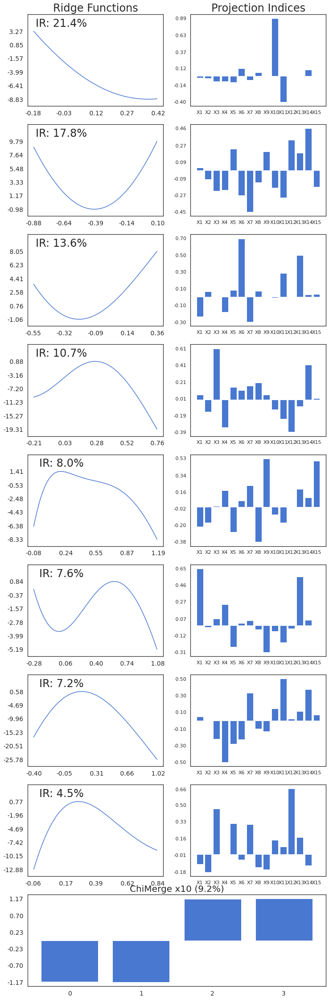

In [209]:
model.visualize("./", "exnn_demo")

In [210]:
pred_train_exnn = model.predict(x_train_exnn)
ex1 = pd.DataFrame(pred_train_exnn).squeeze().tolist()
predictions_exnn1 = [round(value) for value in ex1]
print('Acc Train:',accuracy_score(y_train,predictions_exnn1))

pred_test_exnn = model.predict(x_test_exnn)
ex2 = pd.DataFrame(pred_test_exnn).squeeze().tolist()
predictions_exnn2 = [round(value) for value in ex2]
print('Acc Test:',accuracy_score(y_test,predictions_exnn2))

Acc Train: 0.7276204135293415
Acc Test: 0.7021988527724665


#### DNN Model

In this section, we proposed a self-designed DNN model. 
1. This model inherited the idea of GAMI-Net, which is to combine a main learner and an error learner. Please note that our main learner and error learner have the same structure, so our following explainations applied to both of them.
2. The learner is composed of 3 logistic regression model, with batch normalization. We add 2 neural networks as encoders in-between the logistic regressions to avoide the multi-colinearity of these 3 logistic regression models.
3. The weight of 3 logistic regression models are also trainable, and will be automatically trained during the optimization step.

In [211]:
from pygam import LogisticGAM, f, s

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression

import torch.nn as nn
import torch.nn.functional as F
import torch
import torchvision as tv
from torchvision import transforms
import torch.optim as opt


import xgboost as xgb

import warnings
warnings.filterwarnings("ignore")

In [212]:
class Learner(nn.Module):
  def __init__(self):
    super(Learner, self).__init__()
    self.input_features = 17

    self.BN = nn.BatchNorm1d(num_features=self.input_features, eps=1e-3, momentum=0.02)
    
    self.alpha = nn.Parameter(torch.Tensor([1/3]))
    self.beta = nn.Parameter(torch.Tensor([1/3]))
    self.gamma = nn.Parameter(torch.Tensor([1/3]))
    
    self.encode_1 = nn.Sequential(*[
                 nn.Linear(in_features=self.input_features, out_features = 80, bias = False),
                 nn.Sigmoid(),
                 nn.Linear(in_features=80, out_features = 60, bias = False),
                 nn.Sigmoid(),                           
                 nn.Linear(in_features=60, out_features = 40, bias = False),
                 nn.Sigmoid(),
                 nn.Linear(in_features=40, out_features = self.input_features, bias = False),
                 nn.Sigmoid(),
                 ])
    
    self.encode_2 = nn.Sequential(*[
                        nn.Linear(in_features=self.input_features, out_features = 50, bias = False),
                        nn.Sigmoid(),
                        nn.Linear(in_features=50, out_features = 25, bias = False),
                        nn.Sigmoid(),                          
                        nn.Linear(in_features=25, out_features = 5, bias = False),
                        nn.Sigmoid()
                        ])
    
    self.logistic_regression_0 = nn.Sequential(*[nn.Linear(in_features=self.input_features, out_features = 1),
                                                nn.Sigmoid()])
    
    self.logistic_regression_1 = nn.Sequential(*[nn.Linear(in_features=self.input_features, out_features = 1),
                                                nn.Sigmoid()])
    
    self.logistic_regression_2 = nn.Sequential(*[nn.Linear(in_features=5, out_features = 1),
                                                nn.Sigmoid()])
    
  def forward(self, inputs):
    #Batch Normalization
    x = inputs
    x = self.BN(x)
    
    #No encoder
    self.lg_0 = self.logistic_regression_0(x)
    
    #encoder 1
    self.features_1 = 0.75*self.encode_1(x) + 0.3*x
    self.lg_1 = self.logistic_regression_1(self.features_1)
    
    #encoder 2
    self.features_2 = 0.9*self.encode_2(x)
    self.lg_2 = self.logistic_regression_2(self.features_2)

    lg_0 = (self.alpha * self.lg_0).reshape(-1,1)
    lg_1 = (self.beta  * self.lg_1).reshape(-1,1)
    lg_2 = (self.gamma * self.lg_2).reshape(-1,1)

    prediction_proba = torch.clamp(lg_0 + lg_1 + lg_2, min=0, max=1)
    return prediction_proba

In [213]:
class Trainer(object):
  def __init__(self, df_train, df_validation):
    super(Trainer, self).__init__()

    self.main = Learner()
    self.error = Learner()

    #configuration
    self.max_itr_main = 300
    self.max_itr_error = 100
    self.change_batch_step = 3
    self.display_step = 50

    # we add a L2 regularization here with lambda=1e-2
    self.optimizer_mainLearner = opt.AdamW(self.main.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-08, 
                               weight_decay=0.00001, 
                               amsgrad=False)
    self.optimizer_errorLearner = opt.AdamW(self.error.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-08, 
                               weight_decay=0.00001, 
                               amsgrad=False)
    
    self.X_train = df_train[df_train.columns.drop('RiskFlag')].astype(np.float32).values
    self.y_train = df_train['RiskFlag'].astype(np.float32).values

    self.X_val = df_validation[df_validation.columns.drop('RiskFlag')].astype(np.float32).values
    self.y_val = df_validation['RiskFlag'].astype(np.float32).values

  def train_one_step(self, model, X_train, y_train, optimizer):
    y_train = torch.tensor(y_train, requires_grad=False).view(-1,1)
    X_train = torch.tensor(X_train)
    loss = F.binary_cross_entropy(model(X_train), y_train)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

  def validate(self, model, X_val, y_val):
    pred = model(X_val).detach().numpy()
    roc_auc_test = roc_auc_score(y_val, pred)
    pred[pred >= 0.5] = 1
    pred[pred < 0.5] = 0
    pred = pred.astype(np.int32)
    auc_test = accuracy_score(y_val, pred)
    return auc_test, roc_auc_test

  def train_mainLearn(self):
    print('===============================================================')
    print('Strat to train the mainLearner')

    X_train = self.X_train
    y_train = self.y_train
    X_val = torch.Tensor(self.X_val)
    y_val = self.y_val

    #initailize the model
    self.main(torch.tensor(X_train))

    random_state = 0
    X_batch_in, X_batch_out = train_test_split(X_train, test_size=0.1, random_state=random_state)
    y_batch_in, y_batch_out = train_test_split(y_train, test_size=0.1, random_state=random_state)

    for _ in range(self.max_itr_main):
      #each time train on small batches
      self.train_one_step(self.main, X_batch_in, y_batch_in, self.optimizer_mainLearner)

      if (_ + 1) % self.change_batch_step == 0:
        
        random_state = _
        X_batch_in, X_batch_out = train_test_split(X_train, test_size=0.1, random_state=random_state)
        y_batch_in, y_batch_out = train_test_split(y_train, test_size=0.1, random_state=random_state)
        
        #validation
        auc_test, roc_auc_test = self.validate(self.main, X_val, y_val)
        if (_+1) % self.display_step == 0:
          print(f'Step: {_+1}: Test accuracy: {auc_test:.2%}  ROC Test accuracy: {roc_auc_test:.4f}')

    print()
    print('---------------------------------------------------------------')
    print('Best mainLearner Performance: ')
    auc_test, roc_auc_test = self.validate(self.main, torch.Tensor(X_train), y_train)
    print(f'Train accuracy: {auc_test:.2%}  ROC Train accuracy: {roc_auc_test:.4f}')
    auc_test, roc_auc_test = self.validate(self.main, X_val, y_val)
    print(f'Test accuracy: {auc_test:.2%}  ROC Test accuracy: {roc_auc_test:.4f}')
    print()

  def train_errorLearn(self):
    print('===============================================================')
    print('Strat to train the errorLearner')
    X_train = torch.Tensor(self.X_train)
    y_train = self.y_train
    X_val = torch.Tensor(self.X_val)
    y_val = self.y_val

    pred = self.main(X_train).view(-1)
    pred[pred >= 0.5] = 1
    pred[pred < 0.5] = 0
    pred = pred.detach().numpy().astype(np.int32)

    #get the training data for error learner
    self.correct_idx = np.where( pred == y_train )[0]
    self.wrong_idx = np.where( pred != y_train )[0]
    print(f'Number of correct idx: {self.correct_idx.shape[0]}')
    print(f'Number of wrong idx: {self.wrong_idx.shape[0]}')

    self.correctx = np.take(X_train, self.correct_idx, axis=0)
    self.correcty = np.take(y_train, self.correct_idx)
    self.wrongx = np.take(X_train, self.wrong_idx, axis=0)
    self.wrongy = np.take(y_train, self.wrong_idx)

    np.random.seed(3612202011)
    correct_idx_random = np.random.randint(0, self.correctx.shape[0], int(0.7*self.correcty.shape[0]))
    print(f'errorLearner is trained on number of correct idx: {int(0.7*self.correcty.shape[0])}')

    X_train = np.concatenate((self.wrongx, np.take(self.correctx, correct_idx_random, axis=0)), axis=0)
    y_train = np.concatenate((self.wrongy, np.take(self.correcty, correct_idx_random, axis=0)), axis=0)

    #model initialization
    self.error(torch.Tensor(X_train))

    random_state = 3612202011
    X_batch_in, X_batch_out = train_test_split(X_train, test_size=0.1, random_state=random_state)
    y_batch_in, y_batch_out = train_test_split(y_train, test_size=0.1, random_state=random_state)

    for _ in range(self.max_itr_error):
      #each time train on small batches
      self.train_one_step(self.error, X_batch_in, y_batch_in, self.optimizer_errorLearner)

      if (_ + 1) % self.change_batch_step == 0:

        random_state = _
        X_batch_in, X_batch_out = train_test_split(X_train, test_size=0.1, random_state=random_state)
        y_batch_in, y_batch_out = train_test_split(y_train, test_size=0.1, random_state=random_state)

        #validation
        auc_test, roc_auc_test = self.validate(self.error, X_val, y_val)
        if (_+1) % self.display_step == 0:
          print(f'Step: {_+1}: Test accuracy: {auc_test:.2%}  ROC Test accuracy: {roc_auc_test:.4f}')
          
    print()
    print('---------------------------------------------------------------')
    print('Best errorLearner Performance: ')
    auc_test, roc_auc_test = self.validate(self.error, torch.Tensor(X_train), y_train)
    print(f'Train accuracy: {auc_test:.2%}  ROC Train accuracy: {roc_auc_test:.4f}')
    auc_test, roc_auc_test = self.validate(self.error, X_val, y_val)
    print(f'Test accuracy: {auc_test:.2%}  ROC Test accuracy: {roc_auc_test:.4f}')
    print()




In [214]:
class conmbinedLearner(nn.Module):
  def __init__(self, trainer):
    super(conmbinedLearner, self).__init__()
    self.mainLearner = trainer.main
    self.errorLearner = trainer.error

  def forward(self, inputs):
    alpha = 0.999
    prediction_proba = alpha*self.mainLearner(inputs).view(-1,1) + (1-alpha)*self.errorLearner(inputs).view(-1,1)
    return prediction_proba

In [215]:
torch.manual_seed(0)
trainer = Trainer(df_train_final, df_test_final)
trainer.train_mainLearn()
trainer.train_errorLearn()

Strat to train the mainLearner
Step: 150: Test accuracy: 70.84%  ROC Test accuracy: 0.7709
Step: 300: Test accuracy: 70.70%  ROC Test accuracy: 0.7793

---------------------------------------------------------------
Best mainLearner Performance: 
Train accuracy: 72.36%  ROC Train accuracy: 0.7931
Test accuracy: 70.70%  ROC Test accuracy: 0.7793

Strat to train the errorLearner
Number of correct idx: 6054
Number of wrong idx: 2313
errorLearner is trained on number of correct idx: 4237

---------------------------------------------------------------
Best errorLearner Performance: 
Train accuracy: 65.11%  ROC Train accuracy: 0.7098
Test accuracy: 70.89%  ROC Test accuracy: 0.7677



In [216]:
model = conmbinedLearner(trainer)

X_train = torch.Tensor(df_train_final[df_train_final.columns.drop('RiskFlag')].astype(np.float32).values)
y_train = torch.Tensor(df_train_final['RiskFlag'].astype(np.float32).values)

X_test = torch.Tensor(df_test_final[df_test_final.columns.drop('RiskFlag')].astype(np.float32).values)
y_test = torch.Tensor(df_test_final['RiskFlag'].astype(np.float32).values)

print('Combined model performance:')

auc_test, roc_auc_test = trainer.validate(model, X_train, y_train)
print(f'Train accuracy: {auc_test:.2%}  ROC Train accuracy: {roc_auc_test:.4f}')

auc_test, roc_auc_test = trainer.validate(model, X_test, y_test)
print(f'Test accuracy: {auc_test:.2%}  ROC Test accuracy: {roc_auc_test:.4f}')

Combined model performance:
Train accuracy: 72.36%  ROC Train accuracy: 0.7932
Test accuracy: 70.70%  ROC Test accuracy: 0.7792


Interpretation of DNN model

In [217]:
X_train = torch.Tensor(df_train_final[df_train_final.columns.drop('RiskFlag')].values)
y_train = torch.Tensor(df_train_final['RiskFlag'].values)

X_test = torch.Tensor(df_test_final[df_test_final.columns.drop('RiskFlag')].values)
y_test = torch.Tensor(df_test_final['RiskFlag'].values)



n_explain = 600
device = torch.device('cpu')
model = model.to(device)
explainer = shap.DeepExplainer(model, X_test[0:n_explain])

In [218]:
explainer.expected_value

array([0.47], dtype=float32)

In [219]:
shap_values = explainer.shap_values(X_test[0:n_explain])

local interpretation

In [220]:
shap.initjs()
i = 1
shap.force_plot(base_value=explainer.expected_value[0], shap_values=shap_values[i], 
                features=df_test_final.iloc[i,1:])

In [221]:
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values, features=df_test_final.iloc[:,1:])

global interpretation

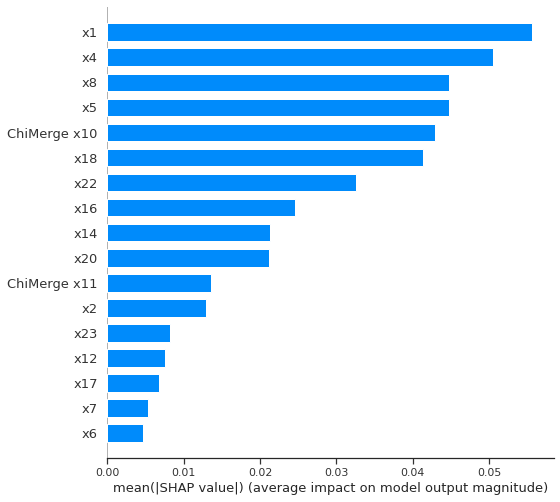

In [222]:
shap.summary_plot(shap_values, feature_names=feature_names_1, plot_type='bar')

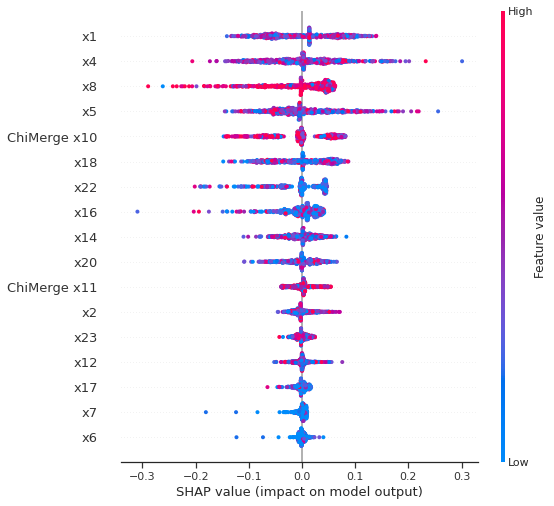

In [223]:
shap.summary_plot(shap_values, df_train_final.iloc[:n_explain,1:],feature_names=feature_names_1)

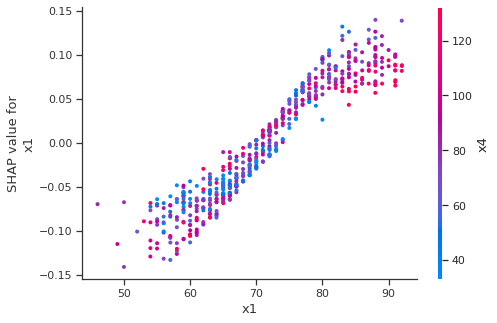

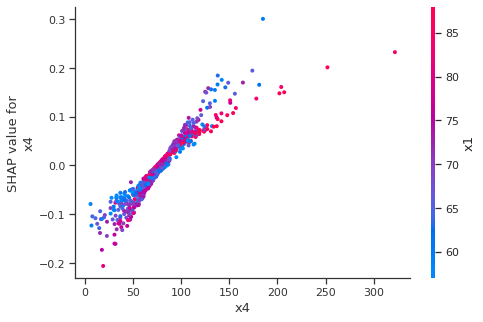

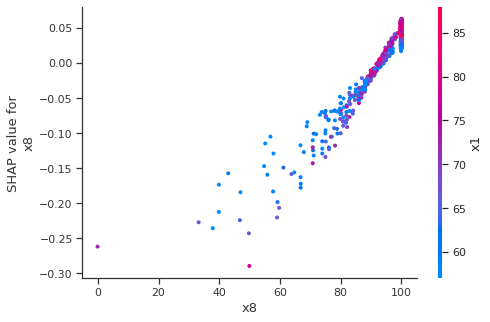

In [224]:
shap.dependence_plot('x1', shap_values, df_test_final.iloc[:n_explain,1:].values, x_jitter=1, feature_names=feature_names_1)
shap.dependence_plot('x4', shap_values, df_test_final.iloc[:n_explain,1:].values, x_jitter=1, feature_names=feature_names_1)
shap.dependence_plot('x8', shap_values, df_test_final.iloc[:n_explain,1:].values, x_jitter=1, feature_names=feature_names_1)

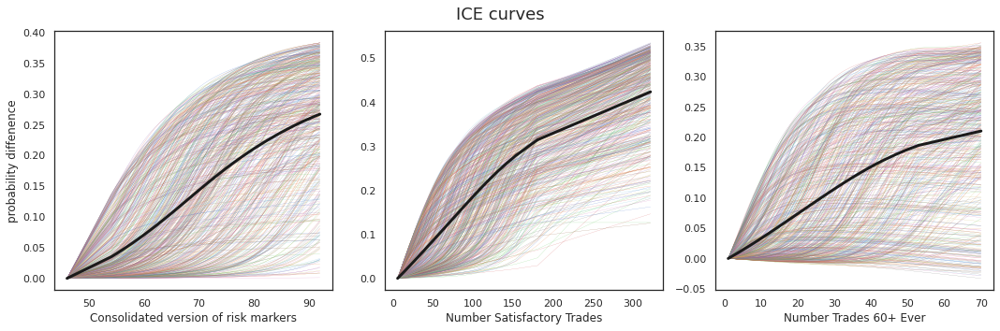

In [225]:
def pred_fun(X_train):
    return model(torch.Tensor(X_train)).detach().numpy()

def __get_quantiles(x):
    return np.greater.outer(x, x).sum(axis=1) / x.size
icebox.__get_quantiles = __get_quantiles

# plot the first 3 features
iport_features = [feature_names[0],feature_names[3],feature_names[4]]
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for i, feature_name in enumerate(['x1','x4','x5']):
    plt.subplot(axes[i])
    ice_df = icebox.ice(df_test_final.iloc[:n_explain,1:], column=feature_name,
                        predict=pred_fun, num_grid_points=100)
    icebox.ice_plot(ice_df, linewidth=0.15, plot_pdp=True,
                    pdp_kwargs={'c': 'k', 'linewidth': 3}, centered=True, ax=axes[i])
    axes[i].set_xlabel(iport_features[i])

axes[0].set_ylabel('probability diffenence')
plt.suptitle('ICE curves', fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.95])

Evaluation of 2-layer DNN model

ROC Curve

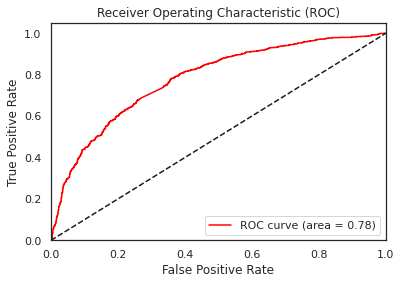

In [226]:
def plot_roc(pred_proba,y):
    fpr, tpr, _ = roc_curve(y, pred_proba) 
    roc_auc = auc(fpr, tpr) 
    plt.plot(fpr,tpr,label='ROC curve (area = %0.2f)'% roc_auc,color='red')
    
    plt.plot([0,1],[0,1],'k--')
    
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)')
    
    plt.legend(loc="lower right") 
    plt.show()

pred_proba = model(X_test).detach().numpy()
plot_roc(pred_proba, y_test)

Confusion Matrix

[[825 272]
 [339 656]]


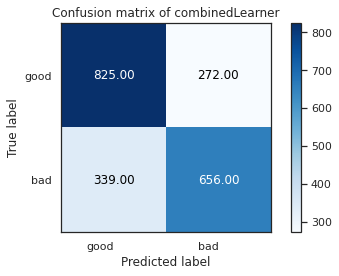

In [227]:
def plot_confusion_matrix(y_true, y_pred, classes, title,
                          cmap=plt.cm.Blues):
    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    print(cm)

    fig, ax = plt.subplots(figsize=(6,4))
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=0, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax
pred = np.asarray(model(X_test).detach().numpy()+0.5, dtype=np.int32)
np.set_printoptions(precision=2)
plot_confusion_matrix(y_test, pred, classes=['good', 'bad'],
                      title='Confusion matrix of combinedLearner')

## Model with Monotonicity Constrains

In this section, we have proposed 2 models: XG boost with feature engineering and XG boost using raw data.

We selected `XG boost (with raw data)` as our final model for its higher test accuracy of `72.1%`.

We used `LIME` and `SHAP` packages for interpretation for both models. Please note that `detailed explanations will only be given under the XG boost (with raw data)` section.

### Proposed Models

#### XG boost (with feature enginnering)

In [228]:
import xgboost as xgb

In [229]:
dtrain = xgb.DMatrix(x_train, y_train)
dtest = xgb.DMatrix(x_test, y_test)

#setting default parameters
param = {'silent':True ,'objective':'binary:logistic',"eta":0.05, 'eval_metric': 'rmse',
         'monotone_constraints':"(1,1,1,1,-1,-1,1,0,0,-1,-1,-1,0,-1,0,1,1)"}

bst_cv = xgb.cv(param, dtrain, 500, nfold = 10, early_stopping_rounds=10)
evallist  = [(dtrain, 'train'), (dtest, 'eval')]
evals_result = {}
bst = xgb.train(param, dtrain, num_boost_round = bst_cv.shape[0], evals_result = evals_result, evals = evallist,  verbose_eval = False)


In [230]:
print (f"Number of boosting rounds: {len(evals_result['train']['rmse'])}")
print (f"Training RMSE: {evals_result['train']['rmse'][-1]:.4%}")
print (f"Testing RMSE: {evals_result['eval']['rmse'][-1]:.4%}")

Number of boosting rounds: 102
Training RMSE: 41.4303%
Testing RMSE: 43.4946%


In [231]:
# evaluate the model
y_train_pred = bst.predict(dtrain)
predictions1 = [round(value) for value in y_train_pred]
print('Train accuracy:',accuracy_score(y_train,predictions1))
y_test_pred = bst.predict(dtest)
predictions2 = [round(value) for value in y_test_pred]
print('Test accuracy:',accuracy_score(y_test,predictions2))

Train accuracy: 0.7416039201625433
Test accuracy: 0.7136711281070746


In [232]:
from sklearn.metrics import roc_auc_score
auc_train = roc_auc_score(y_train,y_train_pred)#based on probability
auc_test = roc_auc_score(y_test,y_test_pred)
print('AUC_Train:',auc_train.round(4))
print('AUC_Test:',auc_test.round(4))

AUC_Train: 0.8242
AUC_Test: 0.7841


Interpretation

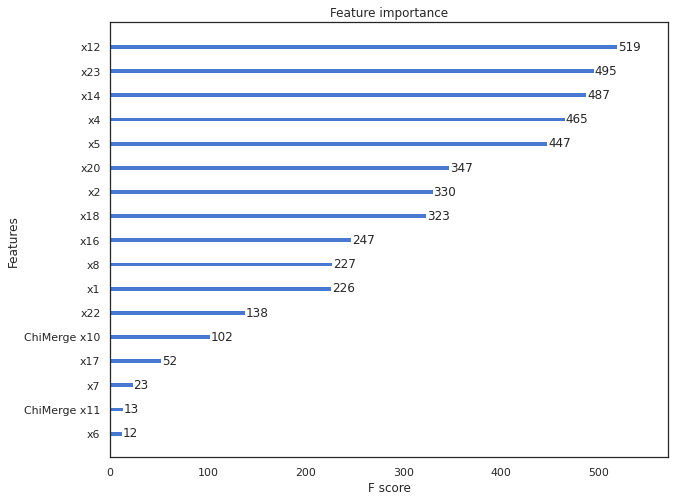

In [233]:
#xgboost feature importance plot
from xgboost import plot_importance
plt.figure(figsize=(10,8))
ax = plt.gca()
xgb.plot_importance(bst,grid=False,ax=ax)
plt.show()

In [234]:
###LIME local 
x_train_lime = x_train.to_numpy()

# To simulate new data points, fit an explainer with data from trainning set
categorical_idx = [15,16]   # get categorical feature names

explainer = LimeTabularExplainer(
    x_train_lime, feature_names=x_train.columns.to_list(), categorical_features=categorical_idx)


In [235]:
def wrapped_predict(data_x):
    '''
    wrap xgboost predict function in order to make it lime-friendly
    - model and feature_names are defined outside
    '''
    
    dummy_y = np.array([ 1 for _ in range(data_x.shape[0]) ])
    tmp_data = xgb.DMatrix(data_x, dummy_y, feature_names=x_train.columns.to_list())
    
    tmp_out = bst.predict(tmp_data)
    
    # add the first column to make it like predict_proba
    out = np.zeros((data_x.shape[0], 2))
    out[:, 0] = 1-tmp_out
    out[:, 1] = tmp_out
    
    return out

i = 1
exp = explainer.explain_instance(x_test.iloc[i,:], wrapped_predict)
exp.show_in_notebook(show_table=True)

In [236]:
###shap

# define the explainer
n_explain = 600
explainer = shap.TreeExplainer(bst, x_train[:n_explain])
# calculate the shape value on training data
shap_values = explainer.shap_values(x_train[:n_explain])

In [237]:
explainer.expected_value

-0.3149160602606389

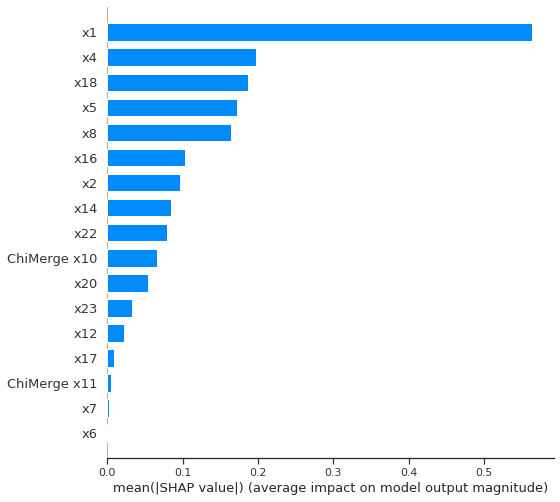

In [238]:
shap.summary_plot(shap_values, x_train, plot_type="bar",feature_names=feature_names_1)

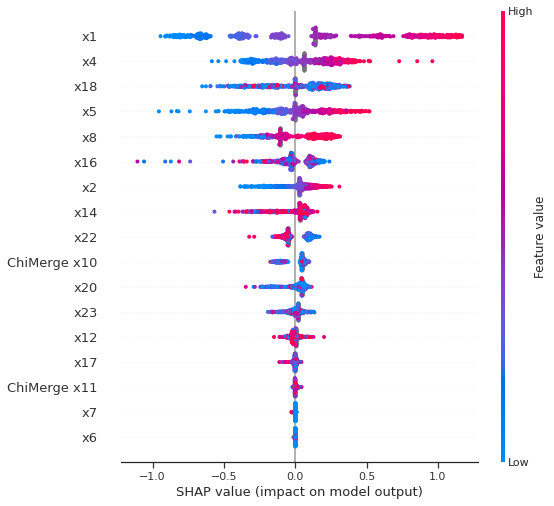

In [239]:
shap.summary_plot(shap_values, df_train.iloc[:n_explain,1:],feature_names=feature_names_1)

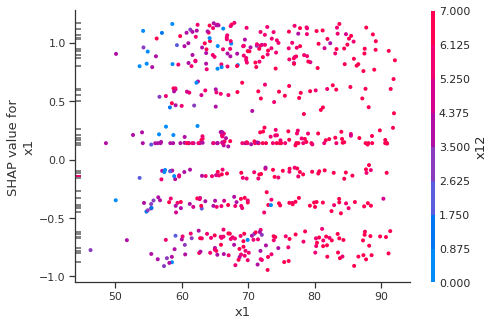

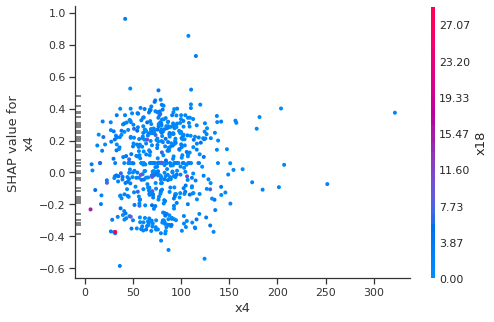

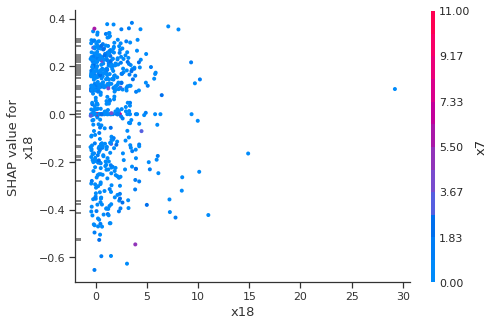

In [240]:
shap.dependence_plot('x1', shap_values, df_test.iloc[:n_explain,1:].values, x_jitter=1, feature_names=feature_names_1)
shap.dependence_plot('x4', shap_values, df_test.iloc[:n_explain,1:].values, x_jitter=1, feature_names=feature_names_1)
shap.dependence_plot('x18', shap_values, df_test.iloc[:n_explain,1:].values, x_jitter=1, feature_names=feature_names_1)

In [241]:
shap.initjs()
i = 1
shap.force_plot(base_value=explainer.expected_value, shap_values=shap_values[i], 
                features=df_test.iloc[i,1:])

In [242]:
# force_plot for first 200 trainning samples
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[:200], x_train[:200], feature_names=feature_names_1)

#### XG boost with raw data
 <font color=blue>**selected as final model**</font>

In [243]:
dtrain = xgb.DMatrix(x_train_nan, y_train_nan)
dtest = xgb.DMatrix(x_test_nan, y_test_nan)
#setting default parameters
param = {'silent':True ,'objective':'binary:logistic',"eta":0.05, 'eval_metric': 'rmse',
         'monotone_constraints':"(1,1,1,1,1,-1,-1,1,1,0,0,0,-1,0,1,-1,-1,-1,-1,0,0,-1,0)"}

bst_cv = xgb.cv(param, dtrain, 500, nfold = 10, early_stopping_rounds=10)
evallist  = [(dtrain, 'train'), (dtest, 'eval')]
evals_result = {}
bst_raw = xgb.train(param, dtrain, num_boost_round = bst_cv.shape[0], 
                evals_result = evals_result, 
                evals = evallist,  verbose_eval = False)

In [244]:
y_train_pred = bst_raw.predict(dtrain)
predictions1 = [round(value) for value in y_train_pred]
print('Train accuracy:',accuracy_score(y_train_nan,predictions1))
y_test_pred = bst_raw.predict(dtest)
predictions2 = [round(value) for value in y_test_pred]
print('Test accuracy:',accuracy_score(y_test_nan,predictions2))

Train accuracy: 0.7473407433966774
Test accuracy: 0.72131931166348


<font color=blue>**Interpretation**</font>

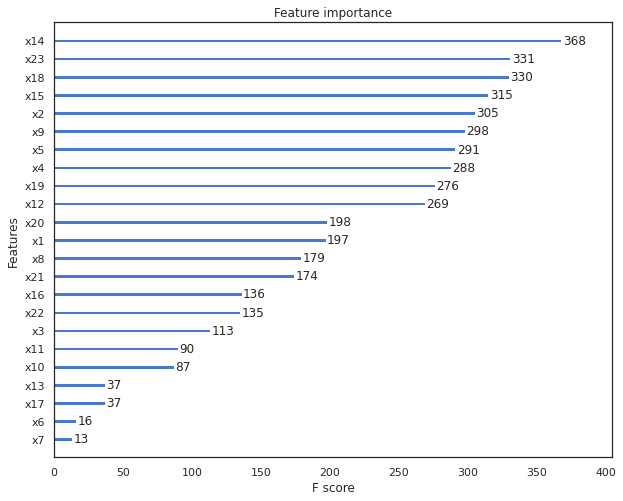

In [245]:
#xgboost feature importance plot
from xgboost import plot_importance
plt.figure(figsize=(10,8))
ax = plt.gca()
xgb.plot_importance(bst_raw,grid=False,ax=ax)
plt.show()

<font color=blue>**Global Interpretation by SHAP**</font>

In [246]:
#shap
# define the explainer

n_explain = 600
explainer = shap.TreeExplainer(bst_raw, x_train_nan[:n_explain])
# calculate the shape value on training data
shap_values = explainer.shap_values(x_train_nan[:n_explain])

In [247]:
explainer.expected_value

-0.30116751132050923

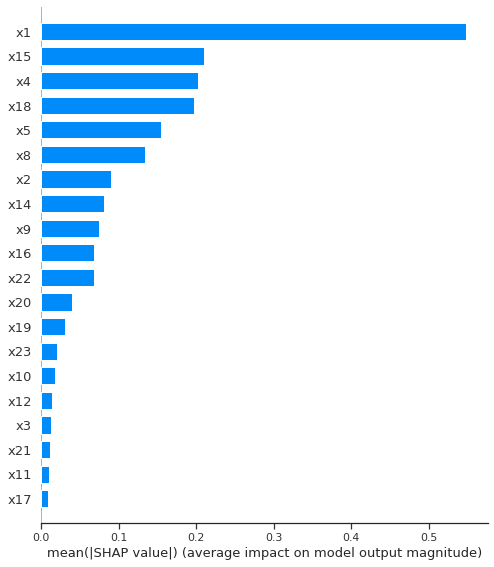

In [248]:
shap.summary_plot(shap_values, x_train_nan, plot_type="bar",feature_names=feature_names_nan)

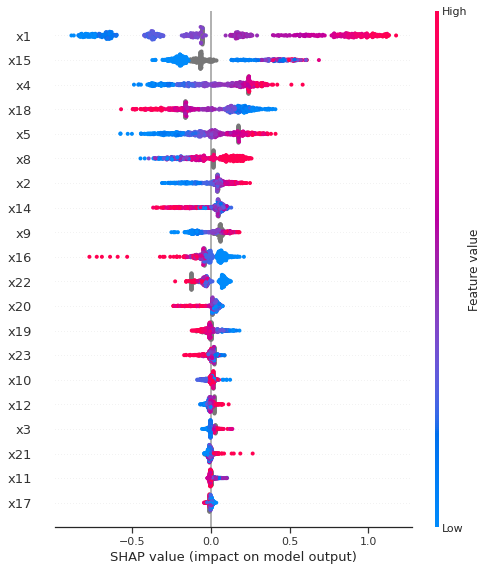

In [249]:
shap.summary_plot(shap_values, df_train_nan.iloc[:n_explain,1:],feature_names=feature_names_nan)

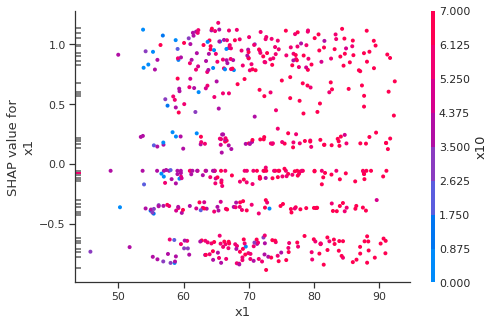

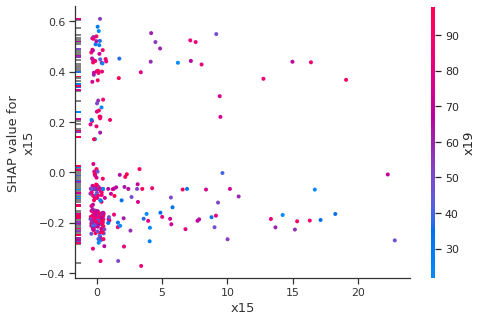

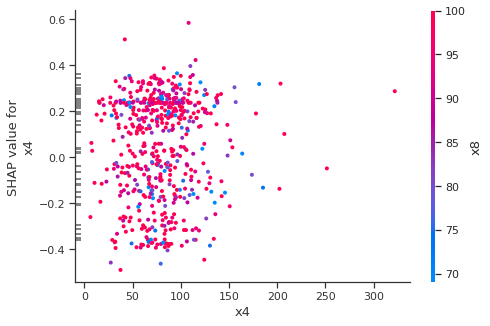

In [250]:
shap.dependence_plot('x1', shap_values, df_test_nan.iloc[:n_explain,1:].values, x_jitter=1, feature_names=feature_names_nan)
shap.dependence_plot('x15', shap_values, df_test_nan.iloc[:n_explain,1:].values, x_jitter=1, feature_names=feature_names_nan)
shap.dependence_plot('x4', shap_values, df_test_nan.iloc[:n_explain,1:].values, x_jitter=1, feature_names=feature_names_nan)

From the above plots, we can see that:
1. The features influence the final prediction by up to 0.5.
2. More specifically, there are 3 most important features: x1 stands for the consolidated version of risk markers, x15 stands for months since most recent inquiry, and x4 stands for the average months in file.
3. It is clear that the higher the consolidated version of risk markers, the more possible that this person would be recognised as good. The more recent the inquiry was made, the more possible that the person will be recognised as bad.
4. Similar explanation can be applied to all the other features. 

We noticed from both two selected models, x1 (the consolidated version of risk markers) plays an important role in prediction. It is because that the consolidated version of risk markers has included other feature and past histories.

<font color=blue>**Local Interpretaion by SHAP**</font>

To better illustrate the local interpertation, we used 3 clients' data as example (they are used in the local interpretation of selected model without monotonicity as well):
1. Client No.1: Alice
2. Client No.11: Bob
3. Client No.6: Cindy

Similar explanations can be applied to other local points.

In [251]:
shap.initjs()
i = 1
shap.force_plot(base_value=explainer.expected_value, shap_values=shap_values[1], 
                features=df_test_nan.iloc[1,1:])

The SHAP plot shown above is the local interpertaion plot for Client No.1 Alice.
1. 3 percent of all the trades done by Alice were overdue. She has inquiries regarding loan recently. These factors make Alice a very risky person
2. The local SHAP diagram shows that her recent inquiry records push her to the bad side. The bad trades history push her to the bad side as well. Together with all the other factors, our model tends to recognise Alice as Bad.

In [252]:
shap.initjs()
shap.force_plot(base_value=explainer.expected_value, shap_values=shap_values[11], 
                features=df_test_nan.iloc[11,1:])

The SHAP plot shown above is the local interpertaion plot for Client No.11 Bob. 
1. Bob has a pretty satisfying credit record scored as 78. He doesnt have any overdue payment. His first trade record can be traced back to a decade ago, while his most recent purchase was done 4 month ago, meaning that he's not in a situation of having too many trades open. These factors make him a very reliable person. However, 33% of all his trades are paid using installment, which makes the situation a bit ambiguous. 
2. The local SHAP diagram shows that his past risk markers, trade history push him towards the Good side significantly, while his installment history makes him a little bit of Bad. Together with all the other factors, the overall score tends to recognise Bob as good.

In [253]:
shap.initjs()
shap.force_plot(base_value=explainer.expected_value, shap_values=shap_values[6], 
                features=df_test_nan.iloc[6,1:])

The SHAP plot shown above is the local interpertaion plot for Client No.6 Cindy.
1.  Cindy has a long history of trade for nearly 2 decades. During this long time, she never had any overdue payment. She didnt have any inquiry recently. Her consolidated version of risk markers scored 84. These are all good indicators. One thing that is not that satisfactory is that she doesnt have that many of satisfactory trades. Nevertheless, we would still expect her to be good. 
2. As given by the shap diagram, her solid risk marker record pushes her to the good side significantly, while the drawbacks are trivial. She is recognised as good by our model.

In [254]:
# force_plot for first 200 trainning samples
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[:200], x_train_nan[:200], feature_names=feature_names_nan)

## Discussion

### Benchmarks

In [255]:
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,ExtraTreesClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV,cross_val_score,StratifiedKFold

kfold=StratifiedKFold(n_splits=10)

classifiers=[]
classifiers.append(SVC())
classifiers.append(DecisionTreeClassifier())
classifiers.append(RandomForestClassifier())
classifiers.append(ExtraTreesClassifier())
classifiers.append(GradientBoostingClassifier())
classifiers.append(KNeighborsClassifier())
classifiers.append(LogisticRegression())
classifiers.append(LinearDiscriminantAnalysis())

In [256]:
cv_results=[]
for classifier in classifiers:
    cv_results.append(cross_val_score(classifier,x_train,y_train,
                                      scoring='accuracy',cv=kfold,n_jobs=-1))
cv_means=[]
cv_std=[]
for cv_result in cv_results:
    cv_means.append(cv_result.mean())
    cv_std.append(cv_result.std())
cvResDf=pd.DataFrame({'cv_mean':cv_means,
                     'cv_std':cv_std,
                     'algorithm':['SVC','DecisionTreeCla','RandomForestCla','ExtraTreesCla',
                                  'GradientBoostingCla','KNN','LR','LinearDiscrimiAna']})
cvResDf

,cv_mean,cv_std,algorithm
0,0.718294,0.014253,SVC
1,0.626623,0.010832,DecisionTreeCla
2,0.716743,0.014719,RandomForestCla
3,0.713756,0.012512,ExtraTreesCla
4,0.718774,0.011518,GradientBoostingCla
5,0.671090,0.011464,KNN
6,0.709451,0.012594,LR
7,0.718177,0.012574,LinearDiscrimiAna


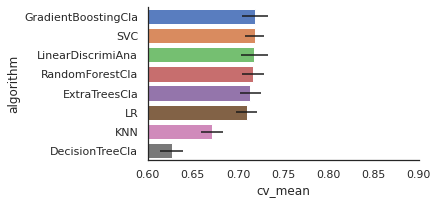

In [257]:
cvResFacet=sns.FacetGrid(cvResDf.sort_values(by='cv_mean',ascending=False),sharex=False,
            sharey=False,aspect=2)
cvResFacet.map(sns.barplot,'cv_mean','algorithm',**{'xerr':cv_std},
               palette='muted')
cvResFacet.set(xlim=(0.6,0.9))
cvResFacet.add_legend()

#### Logistic Regression

In [258]:
y_train_log = df_train_final['RiskFlag']
x_train_log = df_train_final.iloc[:,1:]
logreg = LogisticRegression(penalty='l2', solver='newton-cg')
logreg.fit(x_train_log, y_train_log)

y_test_log = df_test_final['RiskFlag']
x_test_log = df_test_final.iloc[:,1:]

# calculate the accuracy for testing dataset

y_test_pred = logreg.predict(x_test_log)
print(f'The accuracy on the test set is: {accuracy_score(y_test_log, y_test_pred):.2%}')

The accuracy on the test set is: 71.03%


#### Generalised Additive Model (GAM)

In [259]:
y_train_gam = df_train_final['RiskFlag']
x_train_gam = df_train_final.iloc[:,1:]
gam_model = LogisticGAM(s(0)+s(1)+s(2)+s(3)+s(4)+s(5)+s(6)+s(7)+s(8)+s(9)+s(10)+\
                        s(11)+s(12)+s(13)+s(14)+s(15)+s(16),
                        max_iter=500, verbose=True, callbacks=['accuracy']) 

gam_model.gridsearch(x_train_gam.values, y_train_gam)

y_test_gam = df_test_final['RiskFlag']
x_test_gam = df_test_final.iloc[:,1:]
y_test_pred_gam = gam_model.predict(x_test_gam)
print(f'Accuracy of GAM: {accuracy_score(y_test_gam, y_test_pred_gam):.2%}')

100% (11 of 11) |########################| Elapsed Time: 0:00:38 Time:  0:00:38


Accuracy of GAM: 71.41%


#### Neural Network

In [260]:
y_train_nn = df_train_final['RiskFlag']
x_train_nn = df_train_final.iloc[:,1:]
y_test_nn = df_test_final['RiskFlag']
x_test_nn = df_test_final.iloc[:,1:]

clf = MLPClassifier(hidden_layer_sizes = [50,25,10], activation='relu', solver='adam', 
                    learning_rate_init = 0.01, max_iter = 1500, random_state=20190005)
clf.fit(x_train_nn, y_train_nn)
print(f"Prediction Accuracy: {accuracy_score(y_test_nn, clf.predict(x_test_nn)):.2%}")

Prediction Accuracy: 70.08%


### Discussion

Accuracy-wise:
1. From the above benchmarks, we can see that our model outperformed them with test accuracy of 72.7%.
2. However, there are models with higher accuracy like the two-layer additive risk model proposed by a team from Duke University (accuracy: 74%). They created 10 sub-scale features and used a two layer model, while we don't have any sub-scale features or sub layers.
3. We might be able to achive higher accuracy with better feature engineering techniques such as imputing missing values in different ways.

Interpretation-wise:
1. Our model is a black-box model. We used SHAP package for local interpretation and global interpretation. The explainability is good with the help of SHAP.
2. However, there are simpler models with higher interpretability like GAM and decision trees which can be interpreted directly. There are also black models with unwrapping functions like ridge and projection indices for explanable neural network. 